In [239]:
from pandas import Series, DataFrame
import numpy as np 
import pandas as pd
import re

from plotly.subplots import make_subplots
from plotly import figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go

from patsy import dmatrices
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn import metrics

# Importing Dataset

In [240]:
df = pd.read_csv(r'/Users/dhruvarora/Documents/UT Austin/Data Science Programming/Group Project/car_insurance_claim.csv')
df.shape

(10302, 27)

In [241]:
df.columns

Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'PARENT1', 'HOME_VAL', 'MSTATUS', 'GENDER', 'EDUCATION', 'OCCUPATION',
       'TRAVTIME', 'CAR_USE', 'BLUEBOOK', 'TIF', 'CAR_TYPE', 'RED_CAR',
       'OLDCLAIM', 'CLM_FREQ', 'REVOKED', 'MVR_PTS', 'CLM_AMT', 'CAR_AGE',
       'CLAIM_FLAG', 'URBANICITY'],
      dtype='object')

In [242]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10302 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          10302 non-null  int64  
 1   KIDSDRIV    10302 non-null  int64  
 2   BIRTH       10302 non-null  object 
 3   AGE         10295 non-null  float64
 4   HOMEKIDS    10302 non-null  int64  
 5   YOJ         9754 non-null   float64
 6   INCOME      9732 non-null   object 
 7   PARENT1     10302 non-null  object 
 8   HOME_VAL    9727 non-null   object 
 9   MSTATUS     10302 non-null  object 
 10  GENDER      10302 non-null  object 
 11  EDUCATION   10302 non-null  object 
 12  OCCUPATION  9637 non-null   object 
 13  TRAVTIME    10302 non-null  int64  
 14  CAR_USE     10302 non-null  object 
 15  BLUEBOOK    10302 non-null  object 
 16  TIF         10302 non-null  int64  
 17  CAR_TYPE    10302 non-null  object 
 18  RED_CAR     10302 non-null  object 
 19  OLDCLAIM    10302 non-nul

id ---->remove                                                 done

kidsdriv---,3,4 can be used for anlaysis                    done

birth  -->format, date,years,month extraction                    done

age ---> 7 null values  16-81 blanks (16,17 legal or not)          done     

homekids --fine

yoj 0-23, blanks are there,impute them with mean,median,mode

income blanks 0 100000 max value

parent,mstatus,redcar-->convert 0,1

homevalue 0 blanks,$ symbol


education,car_use,car_type ->getdummies   education(_zhighschool replace)

occupation-z_blue collar whether has chances for claim or not(blanks)

travtime --(greater distance suggests greater risk

bluebook -->fine

oldclaim->fine

claimfrequency->4,5 can be used for analysis

revoke->yes(insights)

mvr_pts-->fine

clm_amt->remove

car_age -> -3 ,28,blanks

urban city-->remove

# EDA

## Drop ID and CLM_AMT

In [243]:
df = df.drop(columns=['ID', 'CLM_AMT'])

## Remove random "z_" from cells

In [244]:
df = df.applymap(lambda x: x.replace('z_', '') if isinstance(x, str) else x)
df.head()

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/2076983275.py:1: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,...,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,No,M,...,11,Minivan,yes,"$4,461",2,No,3,18.0,0,Highly Urban/ Urban
1,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",No,M,...,1,Minivan,yes,$0,0,No,0,1.0,0,Highly Urban/ Urban
2,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,No,M,...,1,Van,yes,$0,0,No,2,10.0,0,Highly Urban/ Urban
3,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,F,...,4,SUV,no,"$38,690",2,No,3,10.0,0,Highly Urban/ Urban
4,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,M,...,7,Minivan,yes,$0,0,No,0,6.0,0,Highly Urban/ Urban


## Reformat currency to float

In [245]:
columns_to_convert = ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM']

for column in columns_to_convert:
    df[column] = df[column].replace('[\$,]', '', regex=True).astype(float)

df[columns_to_convert].head()

<>:4: SyntaxWarning:

invalid escape sequence '\$'

<>:4: SyntaxWarning:

invalid escape sequence '\$'

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/494427599.py:4: SyntaxWarning:

invalid escape sequence '\$'



,INCOME,HOME_VAL,BLUEBOOK,OLDCLAIM
0,67349.0,0.0,14230.0,4461.0
1,91449.0,257252.0,14940.0,0.0
2,52881.0,0.0,21970.0,0.0
3,16039.0,124191.0,4010.0,38690.0
4,NaN,306251.0,15440.0,0.0


## Convert BIRTH

In [246]:
df['BIRTH'].apply(lambda x: x[-2:]).sort_values().unique()

array(['18', '19', '23', '25', '26', '27', '28', '29', '30', '31', '32',
       '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43',
       '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54',
       '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65',
       '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76',
       '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87'],
      dtype=object)

`BIRTH` year ranges from 18 to 87, meaning all birthdates are between 1918 and 1987.

In [247]:
df['BIRTH'] = df['BIRTH'].apply(lambda x: x[:-2] + '19' + x[-2:])
df['BIRTH'] = pd.to_datetime(df['BIRTH'], format='%d%b%Y')

# Extract the year and month from the 'BIRTH' column
df['BIRTH_YEAR'] = df['BIRTH'].dt.year
df['BIRTH_MONTH'] = df['BIRTH'].dt.month

# Show the first few rows of the updated dataframe
df[['BIRTH', 'BIRTH_YEAR', 'BIRTH_MONTH']].head()

,BIRTH,BIRTH_YEAR,BIRTH_MONTH
0,1939-03-16,1939,3
1,1956-01-21,1956,1
2,1951-11-18,1951,11
3,1964-03-05,1964,3
4,1948-06-05,1948,6


## Missing Values

In [248]:
df.isnull().sum()[df.isnull().sum() > 0]

AGE             7
YOJ           548
INCOME        570
HOME_VAL      575
OCCUPATION    665
CAR_AGE       639
dtype: int64

`AGE`, `YOJ`, `INCOME`, `HOME_VAL`, `OCCUPATION`, `CAR_AGE` have null values.

### Age

In [249]:
age_null_idx = df[df.AGE.isna()].index
age_null_idx

Index([295, 1317, 1651, 3749, 4365, 4554, 5227], dtype='int64')

In [250]:
df[['BIRTH', 'AGE']].head()

,BIRTH,AGE
0,1939-03-16,60.0
1,1956-01-21,43.0
2,1951-11-18,48.0
3,1964-03-05,35.0
4,1948-06-05,51.0


It is obvious that the age of policyholder is calculated as of 1999.

In [251]:
df.loc[df['AGE'].isnull(), 'AGE'] = 1999 - df['BIRTH_YEAR']
df.loc[age_null_idx, ['BIRTH', 'AGE']]

,BIRTH,AGE
295,1986-02-18,13.0
1317,1983-11-21,16.0
1651,1984-10-18,15.0
3749,1986-02-17,13.0
4365,1984-02-15,15.0
4554,1985-08-17,14.0
5227,1987-12-03,12.0


Now there are no missing values in age!

### YOJ

There are some intuitive ways to fill the missing values in years on job (YOJ).

- Policyholders that are Home Makers most likely have YOJ of 0

- Policyholders that are students (except for masters and PhD's) most likely have no work experience, hence YOJ = 0

In [252]:
condition = (df['YOJ'].isnull()) & (df['OCCUPATION'] == 'Home Maker')
df.loc[condition, 'YOJ'] = df.loc[condition, 'YOJ'].fillna(0)

condition = (df['YOJ'].isnull()) & (df['OCCUPATION'] == 'Student') & (~df['EDUCATION'].isin(['Masters', 'PhD']))
df.loc[condition, 'YOJ'] = df.loc[condition, 'YOJ'].fillna(0)

df['YOJ'].isnull().sum()

np.int64(448)

The number of missing values in YOJ is reduced from 548 to 448.

For the rest of the missing values, fill with median.

In [253]:
df['YOJ'] = df['YOJ'].fillna(df['YOJ'].median())

### Car Age

For the rows with missing car age, replace with overall median.

In [254]:
condition = (df['CAR_AGE'].isnull()) | (df['CAR_AGE'] < 0)
df.loc[condition, 'CAR_AGE'] = df.loc[~condition, 'CAR_AGE'].median()

### Home Val

For missing home values, fill NA with 0 if the policyholder's occupation is student.

In [255]:
condition = (df['HOME_VAL'].isnull()) & (df['OCCUPATION'] == 'Student')
df.loc[condition, 'HOME_VAL'] = df.loc[condition, 'HOME_VAL'].fillna(0)
df['HOME_VAL'].isnull().sum()

np.int64(518)

The number of NA's dropped from 575 to 518.

For the remaining NA's, fill with median.

In [256]:
df['HOME_VAL'] = df['HOME_VAL'].fillna(df['HOME_VAL'].median())

### Occupation

In [257]:
df.loc[df.OCCUPATION.isnull()]['EDUCATION'].value_counts()

EDUCATION
Masters    424
PhD        241
Name: count, dtype: int64

Since all null values have education of masters and PhD, it is fairly likely that they did not fill out their occupations because they were still students.

We will set student as the default.

In [258]:
df['OCCUPATION'] = df['OCCUPATION'].fillna('Student')

### Income

It is most intuitive to fill NA's in income by the median income of the policyholder's occupation.

In [259]:
df['INCOME'] = df.groupby('OCCUPATION')['INCOME'].transform(lambda x: x.fillna(x.median()))

### Post NA Engineering

In [260]:
df.isnull().sum()

KIDSDRIV       0
BIRTH          0
AGE            0
HOMEKIDS       0
YOJ            0
INCOME         0
PARENT1        0
HOME_VAL       0
MSTATUS        0
GENDER         0
EDUCATION      0
OCCUPATION     0
TRAVTIME       0
CAR_USE        0
BLUEBOOK       0
TIF            0
CAR_TYPE       0
RED_CAR        0
OLDCLAIM       0
CLM_FREQ       0
REVOKED        0
MVR_PTS        0
CAR_AGE        0
CLAIM_FLAG     0
URBANICITY     0
BIRTH_YEAR     0
BIRTH_MONTH    0
dtype: int64

In [261]:
df.head()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,...,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,CLAIM_FLAG,URBANICITY,BIRTH_YEAR,BIRTH_MONTH
0,0,1939-03-16,60.0,0,11.0,67349.0,No,0.0,No,M,...,yes,4461.0,2,No,3,18.0,0,Highly Urban/ Urban,1939,3
1,0,1956-01-21,43.0,0,11.0,91449.0,No,257252.0,No,M,...,yes,0.0,0,No,0,1.0,0,Highly Urban/ Urban,1956,1
2,0,1951-11-18,48.0,0,11.0,52881.0,No,0.0,No,M,...,yes,0.0,0,No,2,10.0,0,Highly Urban/ Urban,1951,11
3,0,1964-03-05,35.0,1,10.0,16039.0,No,124191.0,Yes,F,...,no,38690.0,2,No,3,10.0,0,Highly Urban/ Urban,1964,3
4,0,1948-06-05,51.0,0,14.0,53694.0,No,306251.0,Yes,M,...,yes,0.0,0,No,0,6.0,0,Highly Urban/ Urban,1948,6


## Visualization

### Correlation

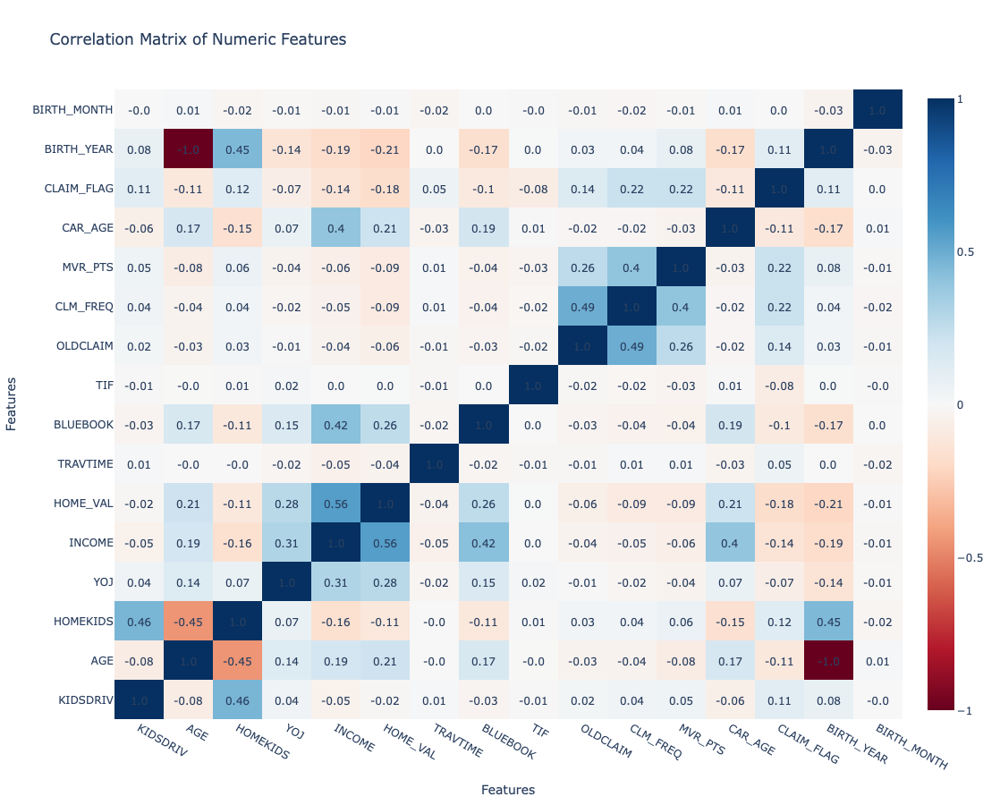

In [262]:
# only numeric columns
df_numeric = df.select_dtypes(include=[np.number])
# plot correlation matrix with 0 as white, -1 as dark blue and 1 as dark red
fig = go.Figure()
fig.add_trace(
    go.Heatmap(
        z=df_numeric.corr(), 
        x=df_numeric.columns, 
        y=df_numeric.columns, 
        colorscale='RdBu', zmin=-1, zmax=1
    )
)

for i in range(len(df_numeric.columns)):
    for j in range(len(df_numeric.columns)):
        fig.add_annotation(
            x=df_numeric.columns[i], y=df_numeric.columns[j],
            text=str(round(df_numeric.corr().iloc[i, j], 2)),
            showarrow=False
        )

fig.update_layout(
    width=900, height=900,
    title='Correlation Matrix of Numeric Features',
    xaxis_title='Features',
    yaxis_title='Features'
)
fig.show()

### Univariate Histograms / Barplots

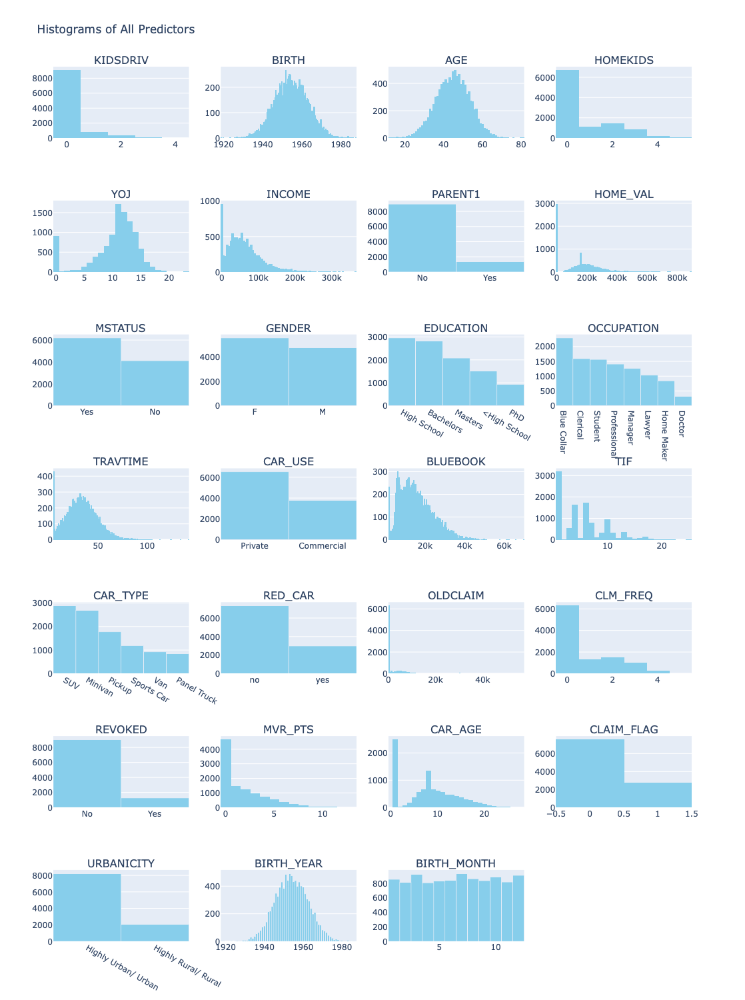

In [263]:
# histogram or bar plot of all predictors depending on the type of the predictor, in separate 26 subplots
fig = make_subplots(rows=7, cols=4, subplot_titles=df.columns)

for i, column in enumerate(df.columns):
    if df[column].dtype in [np.int64, np.float64] or column == 'BIRTH':
        fig.add_trace(
            go.Histogram(x=df[column], name=column, marker_color='skyblue'),
            row=i // 4 + 1, col=i % 4 + 1
        )
    else:
        fig.add_trace(
            go.Bar(x=df[column].value_counts().index, y=df[column].value_counts(), name=column, marker_color='skyblue'),
            row=i // 4 + 1, col=i % 4 + 1
        )

fig.update_layout(
    width=1000, height=1500,
    title='Histograms of All Predictors',
    showlegend=False
)

fig.show()

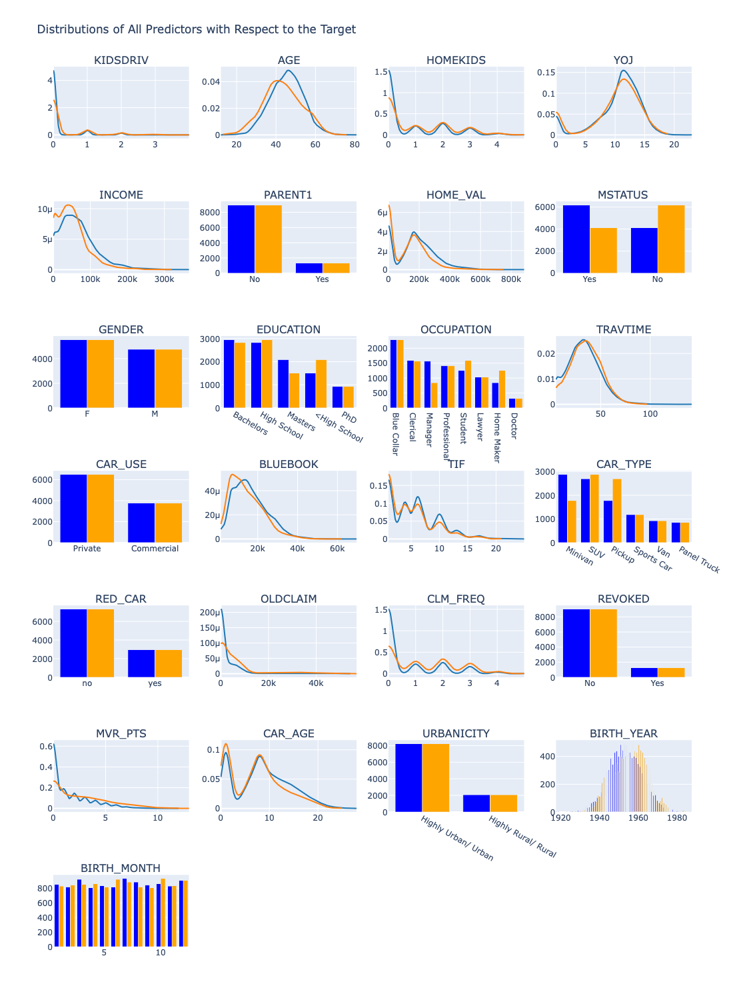

In [264]:
# with the idea above, create a figure with 26 subplots, each subplot showing the distribution of a predictor with respect to the target
viz_df = df.loc[:, (df.columns != 'CLAIM_FLAG') & (df.columns != 'BIRTH')]

fig = make_subplots(rows=7, cols=4, subplot_titles=viz_df.columns)

for i, column in enumerate(viz_df.columns):
    if df[column].dtype in [np.int64, np.float64]:
        fig1 = ff.create_distplot([df[column][df['CLAIM_FLAG'] == 0], df[column][df['CLAIM_FLAG'] == 1]], group_labels=['No Claim', 'Claim'], show_hist=False, show_rug=False)
        fig.add_trace(fig1['data'][0], row=i // 4 + 1, col=i % 4 + 1)
        fig.add_trace(fig1['data'][1], row=i // 4 + 1, col=i % 4 + 1)
    else:
        fig.add_trace(
            # with default color of blue for no claim and orange for claim
            go.Bar(x=df[column][df['CLAIM_FLAG'] == 0].value_counts().index, y=df[column].value_counts(), name=column, marker=dict(color='blue')),
            row=i // 4 + 1, col=i % 4 + 1
        )
        fig.add_trace(
            go.Bar(x=df[column][df['CLAIM_FLAG'] == 1].value_counts().index, y=df[column].value_counts(), name=column, marker=dict(color='orange')),
            row=i // 4 + 1, col=i % 4 + 1
        )

fig.update_layout(
    width=1000, height=1500,
    title='Distributions of All Predictors with Respect to the Target',
    showlegend=False
)

fig.show()

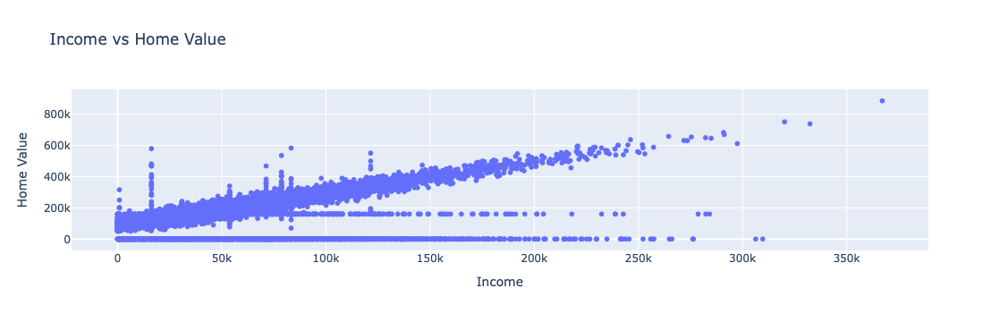

In [265]:
# income and home value
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df['INCOME'], 
        y=df['HOME_VAL'], 
        mode='markers'
    )
)
fig.update_layout(
    title='Income vs Home Value',
    xaxis_title='Income',
    yaxis_title='Home Value'
)
fig.show()

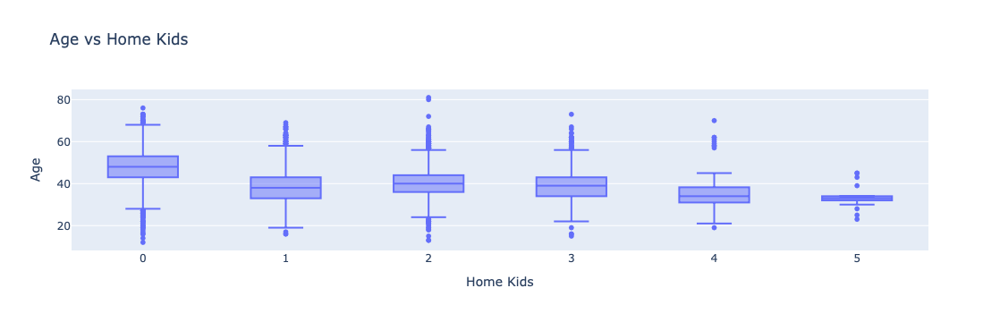

In [266]:
# age and homekids
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['HOMEKIDS'], 
        y=df['AGE'], 
    )
)
fig.update_layout(
    title='Age vs Home Kids',
    xaxis_title='Home Kids',
    yaxis_title='Age'
)
fig.show()

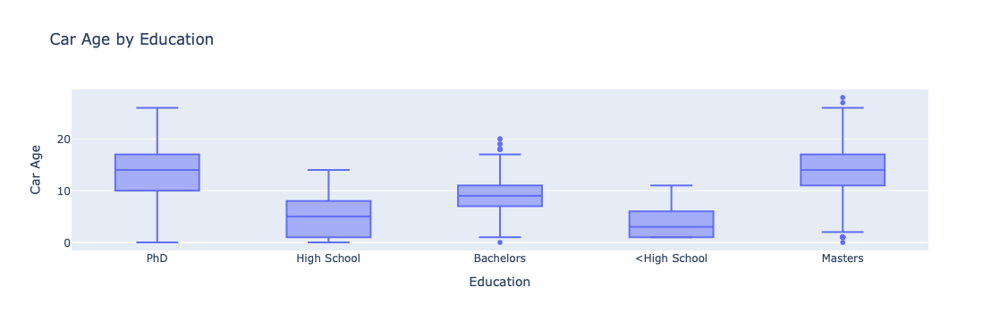

In [267]:
# carage by education
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['EDUCATION'], 
        y=df['CAR_AGE']
    )
)
fig.update_layout(
    title='Car Age by Education',
    xaxis_title='Education',
    yaxis_title='Car Age'
)
fig.show()

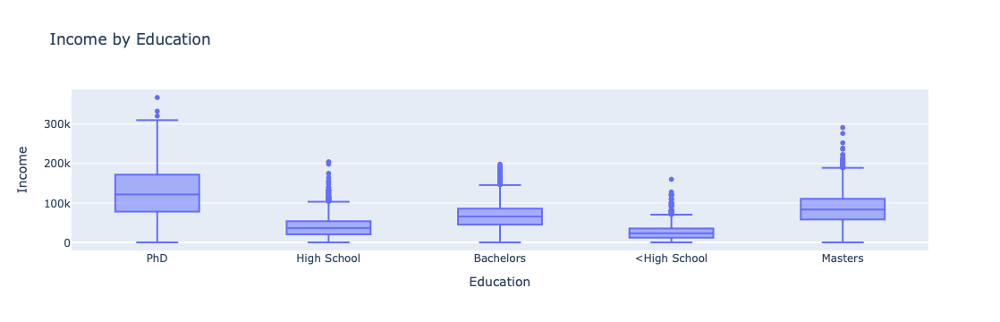

In [268]:
# income by education
fig = go.Figure()
fig.add_trace(
    go.Box(
        x=df['EDUCATION'], 
        y=df['INCOME']
    )
)
fig.update_layout(
    title='Income by Education',
    xaxis_title='Education',
    yaxis_title='Income'
)
fig.show()

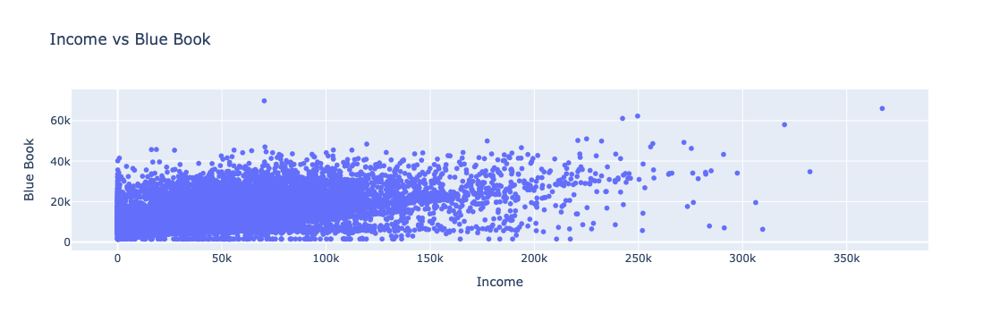

In [269]:
# income and bluebook
fig = go.Figure()
fig.add_trace(
    # scatter with alpha of dots as 0.5
    go.Scatter(
        x=df['INCOME'], 
        y=df['BLUEBOOK'], 
        mode='markers'
    )
)
fig.update_layout(
    title='Income vs Blue Book',
    xaxis_title='Income',
    yaxis_title='Blue Book'
)
fig.show()

## Drop `BIRTH`

In [270]:
df.drop('BIRTH', axis=1, inplace=True)

# Modeling

## Data Preparation

In [271]:
df.head()
df.to_excel(r'C:\Users\Dell\Desktop\UT Austin Summer\Data Science Programming\Car Insurance\output.xlsx', index=False)

In [273]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

new_df=df.copy() #= pd.read_excel(r'C:\Users\Dell\Desktop\UT Austin Summer\Data Science Programming\Car Insurance\output.xlsx')

### Age Analysis(very young people tend to be risky.Maybe very old people also)

In [274]:
# Let's analyze the distribution of age and its relation to the CLAIM_FLAG

# Create age groups to simplify analysis
bins = [0, 16, 25, 35, 45, 55, 65, 75, 100]
labels = ['0-15', '15-25','25-35', '35-45', '45-55', '55-65', '65-75', '75-100']
new_df['AGE_GROUP'] = pd.cut(new_df['AGE'], bins=bins, labels=labels, right=False)


age_claim_analysis = new_df.groupby(['AGE_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
age_claim_analysis['Total'] = age_claim_analysis.sum(axis=1)
age_claim_analysis['Claim_Percentage'] = (age_claim_analysis[1] / age_claim_analysis['Total']) * 100

age_claim_analysis


/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/3449092122.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
AGE_GROUP,,,,
0-15,1,5,6,83.333333
15-25,33,56,89,62.921348
25-35,693,418,1111,37.623762
35-45,2635,1066,3701,28.803026
45-55,3212,822,4034,20.376797
55-65,908,355,1263,28.107680
65-75,72,23,95,24.210526
75-100,2,1,3,33.333333


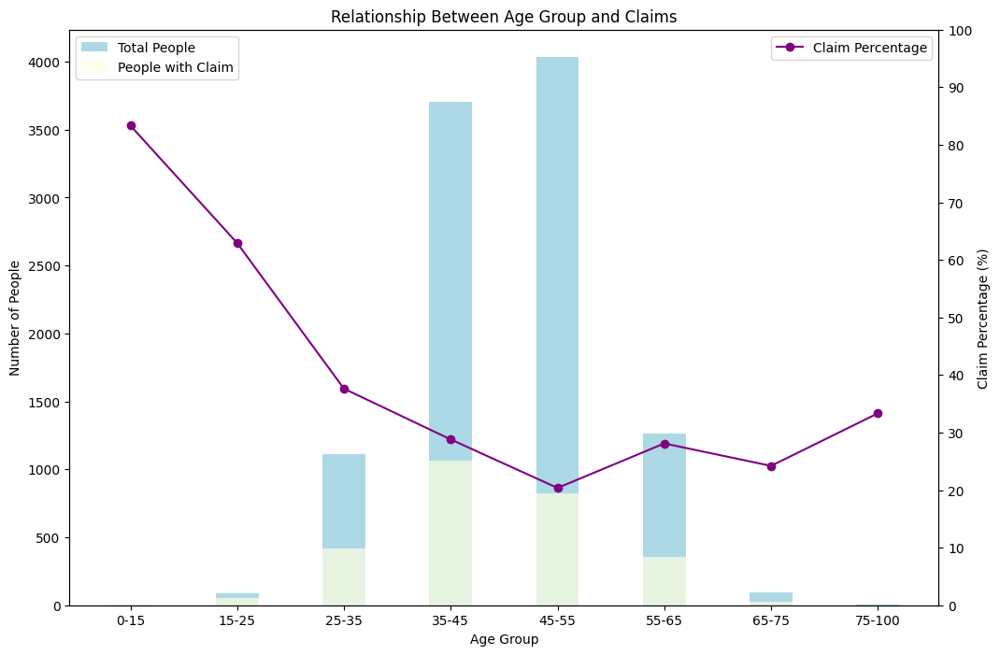

In [275]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each age group
ax1.bar(age_claim_analysis.index, age_claim_analysis['Total'], color='lightblue', label='Total People',width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(age_claim_analysis.index, age_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7,width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(age_claim_analysis.index, age_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Age Group')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Age Group and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

In [276]:
# Let's start by analyzing the BLUEBOOK value against CLAIM_FLAG

# Grouping BLUEBOOK into quantiles to simplify analysis
new_df['BLUEBOOK_GROUP'] = pd.qcut(new_df['BLUEBOOK'], q=5, labels=False)

# Analyze the relationship between BLUEBOOK and CLAIM_FLAG
bluebook_claim_analysis = new_df.groupby(['BLUEBOOK_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
bluebook_claim_analysis['Total'] = bluebook_claim_analysis.sum(axis=1)
bluebook_claim_analysis['Claim_Percentage'] = (bluebook_claim_analysis[1] / bluebook_claim_analysis['Total']) * 100

# Now analyze CAR_AGE
car_age_claim_analysis = new_df.groupby(['CAR_AGE', 'CLAIM_FLAG']).size().unstack(fill_value=0)
car_age_claim_analysis['Total'] = car_age_claim_analysis.sum(axis=1)
car_age_claim_analysis['Claim_Percentage'] = (car_age_claim_analysis[1] / car_age_claim_analysis['Total']) * 100




In [277]:
new_df['BLUEBOOK_GROUP'] = pd.qcut(new_df['BLUEBOOK'], q=5, labels=False)

# Analyze the relationship between BLUEBOOK and CLAIM_FLAG
bluebook_claim_analysis = new_df.groupby(['BLUEBOOK_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
bluebook_claim_analysis['Total'] = bluebook_claim_analysis.sum(axis=1)
bluebook_claim_analysis['Claim_Percentage'] = (bluebook_claim_analysis[1] / bluebook_claim_analysis['Total']) * 100

bluebook_claim_analysis
#ANOVA TEST

CLAIM_FLAG,0,1,Total,Claim_Percentage
BLUEBOOK_GROUP,,,,
0,1334,727,2061,35.274139
1,1455,607,2062,29.437439
2,1588,470,2058,22.837707
3,1559,502,2061,24.357108
4,1620,440,2060,21.359223


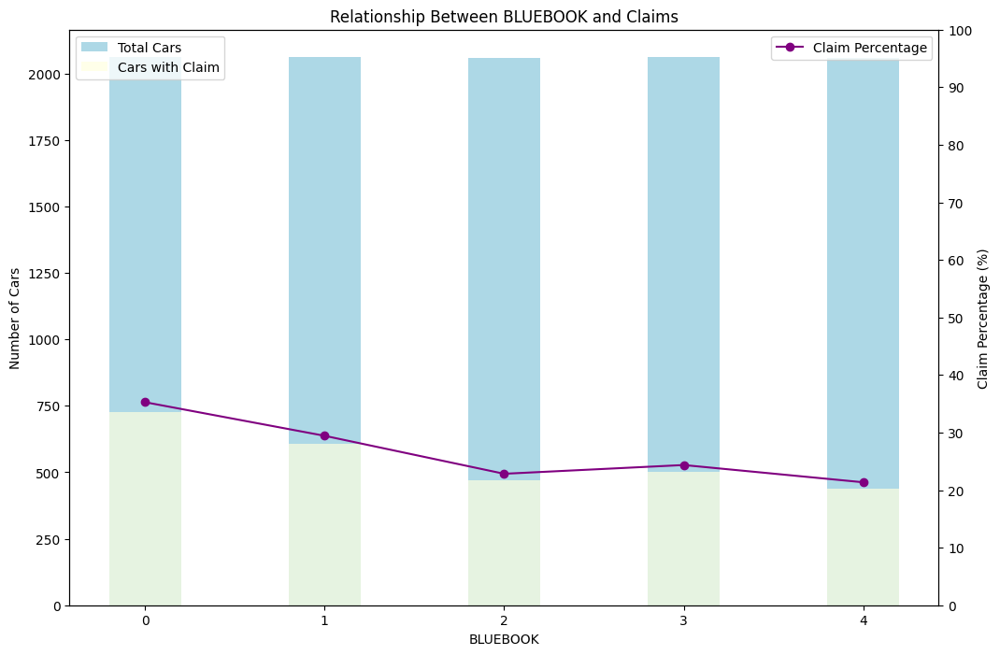

In [278]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of cars in each BLUEBOOK group
ax1.bar(bluebook_claim_analysis.index, bluebook_claim_analysis['Total'], color='lightblue', label='Total Cars',width=0.4)

# Bar plot for the number of cars with CLAIM_FLAG = 1
ax1.bar(bluebook_claim_analysis.index, bluebook_claim_analysis[1], color='lightyellow', label='Cars with Claim', alpha=0.7,width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(bluebook_claim_analysis.index, bluebook_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('BLUEBOOK')
ax1.set_ylabel('Number of Cars')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between BLUEBOOK and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### Typically, older cars are more prone to breakdowns, increasing the likelihood of claims. However, this is not the case here, as the data suggests otherwise."

In [279]:
car_age_claim_analysis = new_df.groupby(['CAR_AGE', 'CLAIM_FLAG']).size().unstack(fill_value=0)
car_age_claim_analysis['Total'] = car_age_claim_analysis.sum(axis=1)
car_age_claim_analysis['Claim_Percentage'] = (car_age_claim_analysis[1] / car_age_claim_analysis['Total']) * 100

car_age_claim_analysis

CLAIM_FLAG,0,1,Total,Claim_Percentage
CAR_AGE,,,,
0.0,3,1,4,25.000000
1.0,1670,819,2489,32.904781
2.0,9,9,18,50.000000
3.0,52,18,70,25.714286
4.0,120,49,169,28.994083
5.0,262,98,360,27.222222
6.0,399,153,552,27.717391
7.0,465,190,655,29.007634
8.0,952,384,1336,28.742515


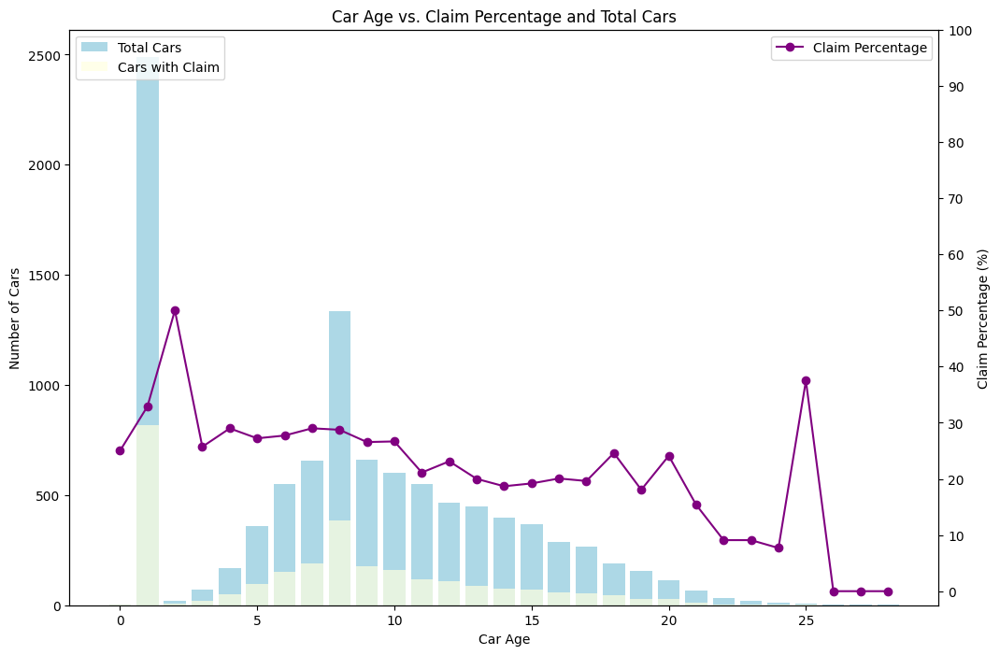

In [280]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of cars for each car age
ax1.bar(car_age_claim_analysis.index, car_age_claim_analysis['Total'], color='lightblue', label='Total Cars')

# Bar plot for the number of cars with CLAIM_FLAG = 1
ax1.bar(car_age_claim_analysis.index, car_age_claim_analysis[1], color='lightyellow', label='Cars with Claim', alpha=0.7)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(car_age_claim_analysis.index, car_age_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Car Age')
ax1.set_ylabel('Number of Cars')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Car Age vs. Claim Percentage and Total Cars')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### Sports cars, pickup trucks, and SUVs are higher-risk, while minivans are lower-risk.

In [281]:
# Finally, analyze CAR_TYPE
car_type_claim_analysis = new_df.groupby(['CAR_TYPE', 'CLAIM_FLAG']).size().unstack(fill_value=0)
car_type_claim_analysis['Total'] = car_type_claim_analysis.sum(axis=1)
car_type_claim_analysis['Claim_Percentage'] = (car_type_claim_analysis[1] / car_type_claim_analysis['Total']) * 100
car_type_claim_analysis


CLAIM_FLAG,0,1,Total,Claim_Percentage
CAR_TYPE,,,,
Minivan,2229,465,2694,17.260579
Panel Truck,628,225,853,26.377491
Pickup,1217,555,1772,31.320542
SUV,2042,841,2883,29.171002
Sports Car,771,408,1179,34.605598
Van,669,252,921,27.361564


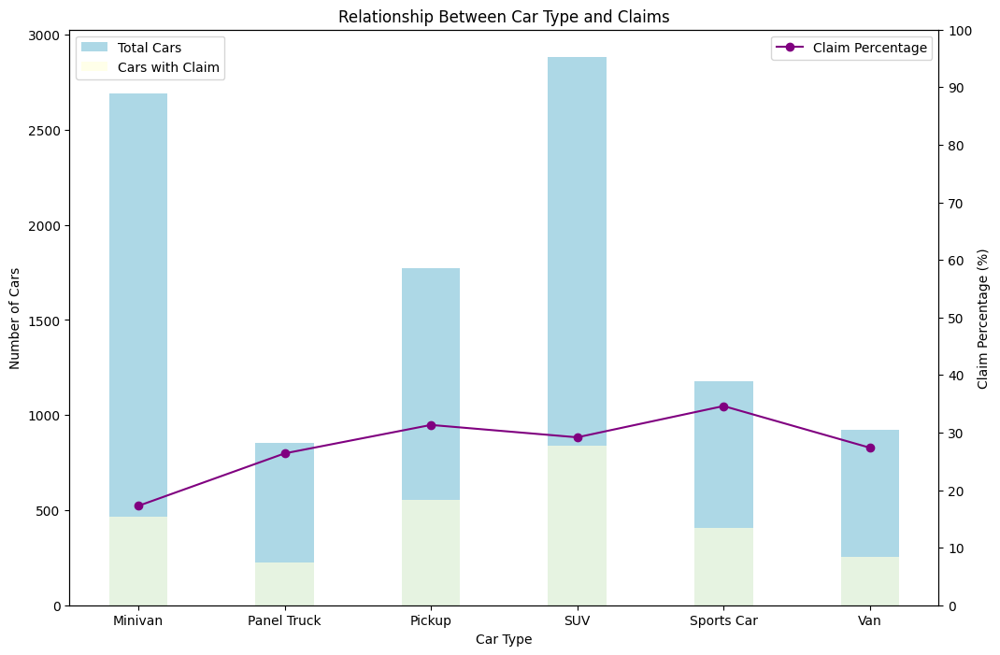

In [282]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of cars in each CAR_TYPE
ax1.bar(car_type_claim_analysis.index, car_type_claim_analysis['Total'], color='lightblue', label='Total Cars', width=0.4)

# Bar plot for the number of cars with CLAIM_FLAG = 1
ax1.bar(car_type_claim_analysis.index, car_type_claim_analysis[1], color='lightyellow', label='Cars with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(car_type_claim_analysis.index, car_type_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Car Type')
ax1.set_ylabel('Number of Cars')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Car Type and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### Commercial vehicles, often driven more frequently, have a higher probability of collisions and a greater likelihood of filing claims."

In [283]:
# Analyze the relationship between CAR_USE and CLAIM_FLAG

car_use_claim_analysis = new_df.groupby(['CAR_USE', 'CLAIM_FLAG']).size().unstack(fill_value=0)
car_use_claim_analysis['Total'] = car_use_claim_analysis.sum(axis=1)
car_use_claim_analysis['Claim_Percentage'] = (car_use_claim_analysis[1] / car_use_claim_analysis['Total']) * 100
car_use_claim_analysis




CLAIM_FLAG,0,1,Total,Claim_Percentage
CAR_USE,,,,
Commercial,2479,1310,3789,34.573766
Private,5077,1436,6513,22.048211


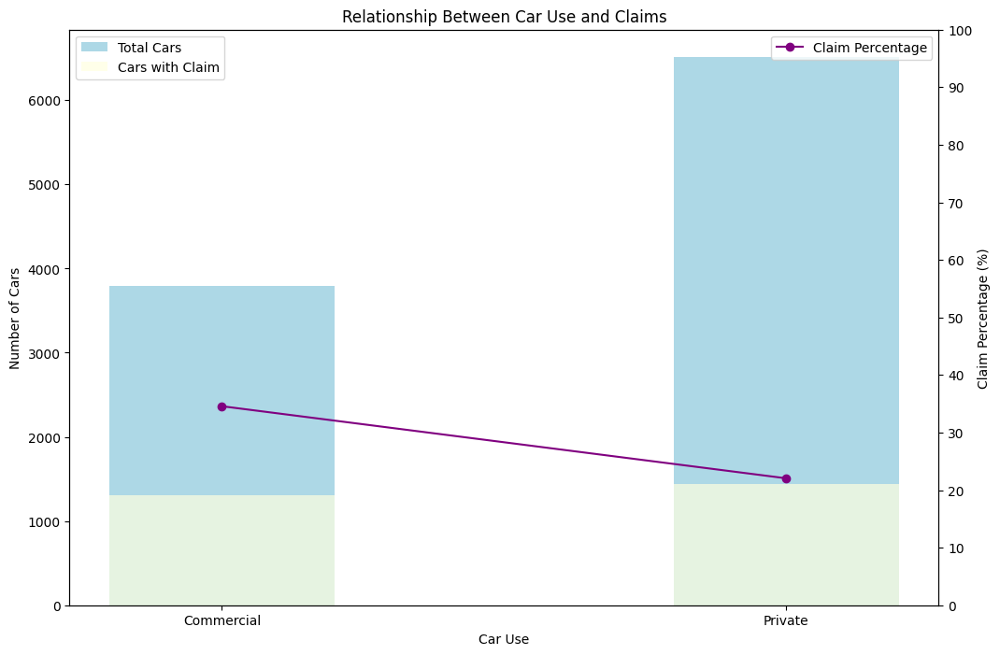

In [284]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of cars for each CAR_USE
ax1.bar(car_use_claim_analysis.index, car_use_claim_analysis['Total'], color='lightblue', label='Total Cars', width=0.4)

# Bar plot for the number of cars with CLAIM_FLAG = 1
ax1.bar(car_use_claim_analysis.index, car_use_claim_analysis[1], color='lightyellow', label='Cars with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(car_use_claim_analysis.index, car_use_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Car Use')
ax1.set_ylabel('Number of Cars')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Car Use and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### Individuals who have filed claims in the past are over twice as likely to file claims in the future.

In [285]:
# # Analyze the relationship between CLM_FREQ (number of claims filed in the past) and CLAIM_FLAG

# clm_freq_claim_analysis = new_df.groupby(['CLM_FREQ', 'CLAIM_FLAG']).size().unstack(fill_value=0)
# clm_freq_claim_analysis['Total'] = clm_freq_claim_analysis.sum(axis=1)
# clm_freq_claim_analysis['Claim_Percentage'] = (clm_freq_claim_analysis[1] / clm_freq_claim_analysis['Total']) * 100
# clm_freq_claim_analysis


In [286]:

new_df['CLM_FREQ_BINNED'] = new_df['CLM_FREQ'].apply(lambda x: '0' if x == 0 else 'greater than 0')

# Group by the binned CLM_FREQ and CLAIM_FLAG, then calculate totals and percentages
clm_freq_claim_analysis = new_df.groupby(['CLM_FREQ_BINNED', 'CLAIM_FLAG']).size().unstack(fill_value=0)
clm_freq_claim_analysis['Total'] = clm_freq_claim_analysis.sum(axis=1)
clm_freq_claim_analysis['Claim_Percentage'] = (clm_freq_claim_analysis[1] / clm_freq_claim_analysis['Total']) * 100
clm_freq_claim_analysis

CLAIM_FLAG,0,1,Total,Claim_Percentage
CLM_FREQ_BINNED,,,,
0,5169,1123,6292,17.848061
greater than 0,2387,1623,4010,40.473815


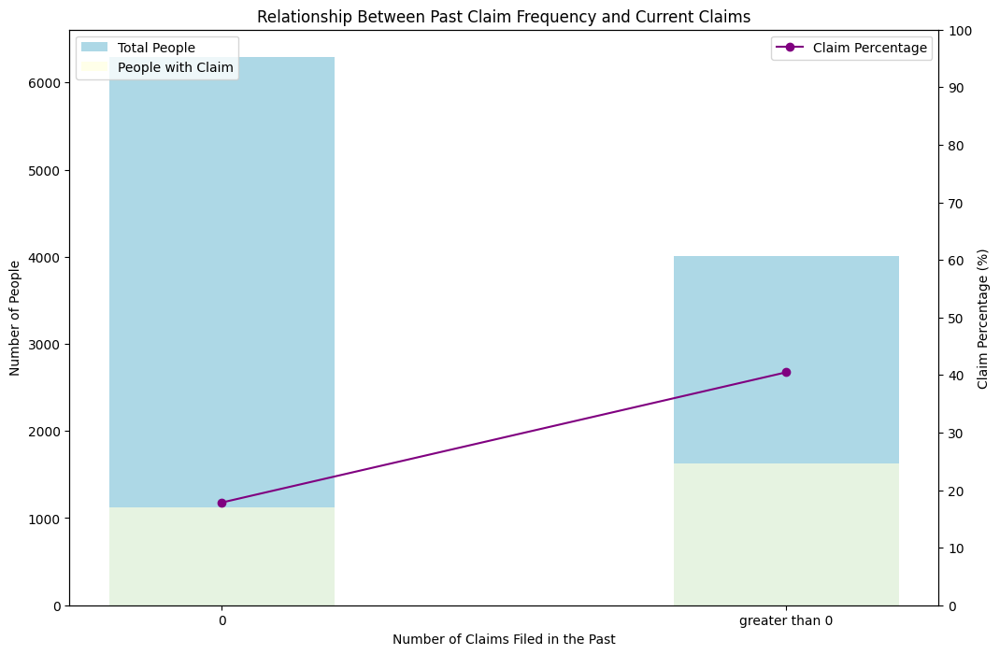

In [287]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people for each binned CLM_FREQ
ax1.bar(clm_freq_claim_analysis.index, clm_freq_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(clm_freq_claim_analysis.index, clm_freq_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(clm_freq_claim_analysis.index, clm_freq_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Number of Claims Filed in the Past')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Past Claim Frequency and Current Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### Individuals with higher education levels, such as PhDs and Masters, have significantly lower claim percentages, indicating safer driving behavior compared to those with lower education levels, like high school or less.

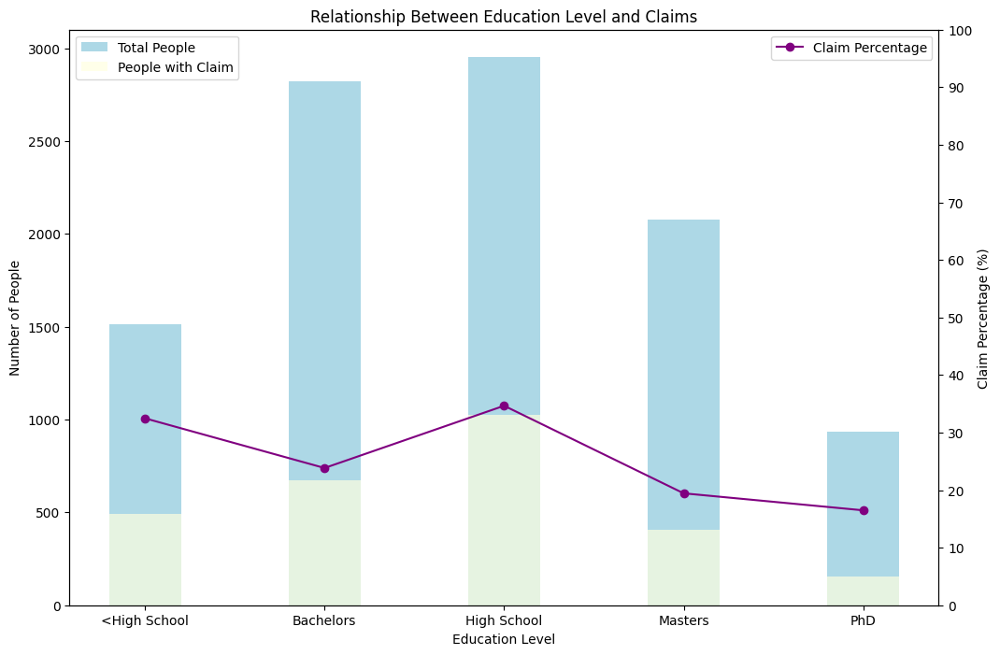

In [288]:
# Analyze the relationship between EDUCATION and CLAIM_FLAG

education_claim_analysis = new_df.groupby(['EDUCATION', 'CLAIM_FLAG']).size().unstack(fill_value=0)
education_claim_analysis['Total'] = education_claim_analysis.sum(axis=1)
education_claim_analysis['Claim_Percentage'] = (education_claim_analysis[1] / education_claim_analysis['Total']) * 100

import matplotlib.pyplot as plt

# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people for each education level
ax1.bar(education_claim_analysis.index, education_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(education_claim_analysis.index, education_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(education_claim_analysis.index, education_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Education Level')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Education Level and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()



### People belong to the High Income group tend to file less claims

In [289]:
# # Grouping INCOME into quantiles to simplify analysis
# new_df['INCOME_GROUP'] = pd.qcut(new_df['INCOME'], q=10, labels=False)

# # Analyze the relationship between INCOME and CLAIM_FLAG
# income_claim_analysis = new_df.groupby(['INCOME_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
# income_claim_analysis['Total'] = income_claim_analysis.sum(axis=1)
# income_claim_analysis['Claim_Percentage'] = (income_claim_analysis[1] / income_claim_analysis['Total']) * 100
# income_claim_analysis

In [290]:
# Define custom income bins based on the describe statistics
bins = [0, 27440.75, 53694, 83448.25, 120000, new_df['INCOME'].max()]
labels = ['Low Income', 'Lower-Middle Income', 'Middle Income', 'Upper-Middle Income', 'High Income']

# Create INCOME_GROUP based on these bins
new_df['INCOME_GROUP'] = pd.cut(new_df['INCOME'], bins=bins, labels=labels, include_lowest=True)

# Analyze the relationship between INCOME_GROUP and CLAIM_FLAG
income_claim_analysis = new_df.groupby(['INCOME_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
income_claim_analysis['Total'] = income_claim_analysis.sum(axis=1)
income_claim_analysis['Claim_Percentage'] = (income_claim_analysis[1] / income_claim_analysis['Total']) * 100

# Display the result
income_claim_analysis

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/1210512829.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
INCOME_GROUP,,,,
Low Income,1696,880,2576,34.161491
Lower-Middle Income,1865,808,2673,30.228208
Middle Income,1850,627,2477,25.312878
Upper-Middle Income,1243,274,1517,18.061964
High Income,902,157,1059,14.825307


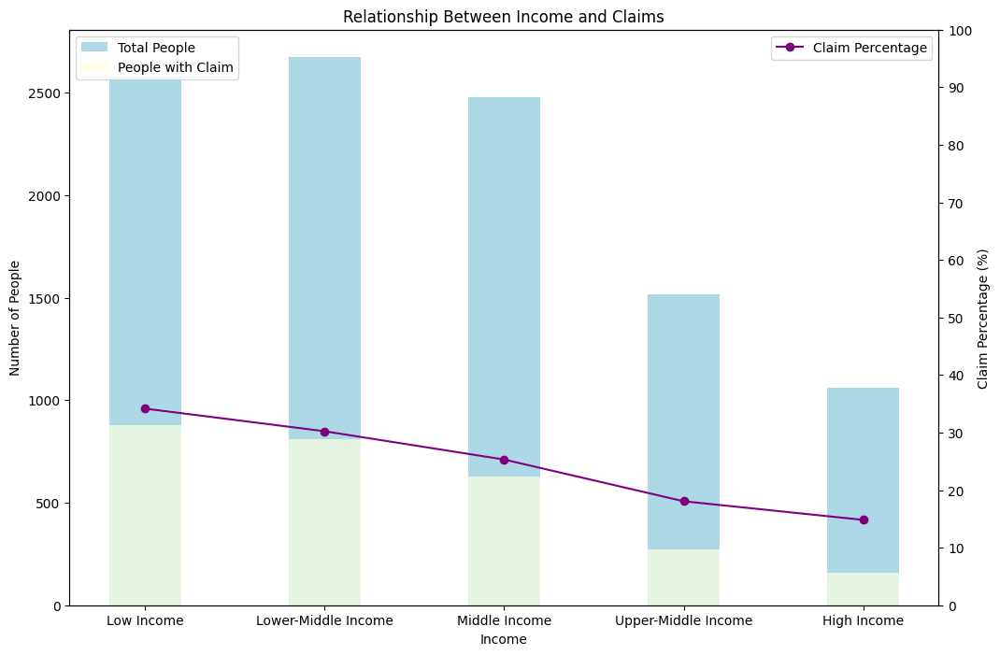

In [291]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each income group
ax1.bar(income_claim_analysis.index, income_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(income_claim_analysis.index, income_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(income_claim_analysis.index, income_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Income')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Income and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### People in Blue Collar or lower income jobs tend to file the highest number of claims 

In [292]:
# Analyze the relationship between OCCUPATION and CLAIM_FLAG
occupation_claim_analysis = new_df.groupby(['OCCUPATION', 'CLAIM_FLAG']).size().unstack(fill_value=0)
occupation_claim_analysis['Total'] = occupation_claim_analysis.sum(axis=1)
occupation_claim_analysis['Claim_Percentage'] = (occupation_claim_analysis[1] / occupation_claim_analysis['Total']) * 100
occupation_claim_analysis


CLAIM_FLAG,0,1,Total,Claim_Percentage
OCCUPATION,,,,
Blue Collar,1485,803,2288,35.096154
Clerical,1109,481,1590,30.251572
Doctor,284,37,321,11.526480
Home Maker,614,229,843,27.164887
Lawyer,845,186,1031,18.040737
Manager,1087,170,1257,13.524264
Professional,1083,325,1408,23.082386
Student,1049,515,1564,32.928389


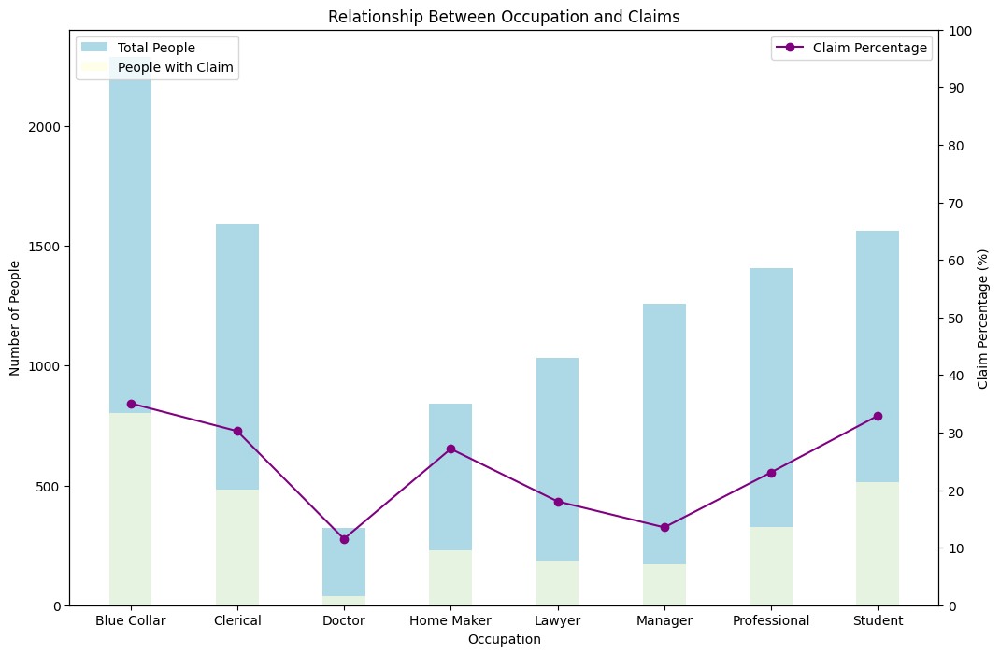

In [293]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each occupation
ax1.bar(occupation_claim_analysis.index, occupation_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(occupation_claim_analysis.index, occupation_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(occupation_claim_analysis.index, occupation_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Occupation')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Occupation and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability

plt.show()

### When kids are behind the wheel, the likelihood of car crashes increases significantly.

In [294]:
# Analyze the relationship between KIDSDRIV (number of children who drive) and CLAIM_FLAG

kidsdriv_claim_analysis = new_df.groupby(['KIDSDRIV', 'CLAIM_FLAG']).size().unstack(fill_value=0)
kidsdriv_claim_analysis['Total'] = kidsdriv_claim_analysis.sum(axis=1)
kidsdriv_claim_analysis['Claim_Percentage'] = (kidsdriv_claim_analysis[1] / kidsdriv_claim_analysis['Total']) * 100

kidsdriv_claim_analysis

CLAIM_FLAG,0,1,Total,Claim_Percentage
KIDSDRIV,,,,
0,6815,2254,9069,24.853898
1,492,312,804,38.805970
2,212,139,351,39.601140
3,35,39,74,52.702703
4,2,2,4,50.000000


In [295]:
new_df['KIDSDRIV_BINNED'] = new_df['KIDSDRIV'].apply(lambda x: 'Does not have kids' if x == 0 else 'Have kids')

# Group by the binned KIDSDRIV and CLAIM_FLAG, then calculate totals and percentages
kidsdriv_claim_analysis = new_df.groupby(['KIDSDRIV_BINNED', 'CLAIM_FLAG']).size().unstack(fill_value=0)
kidsdriv_claim_analysis['Total'] = kidsdriv_claim_analysis.sum(axis=1)
kidsdriv_claim_analysis['Claim_Percentage'] = (kidsdriv_claim_analysis[1] / kidsdriv_claim_analysis['Total']) * 100
kidsdriv_claim_analysis

CLAIM_FLAG,0,1,Total,Claim_Percentage
KIDSDRIV_BINNED,,,,
Does not have kids,6815,2254,9069,24.853898
Have kids,741,492,1233,39.902676


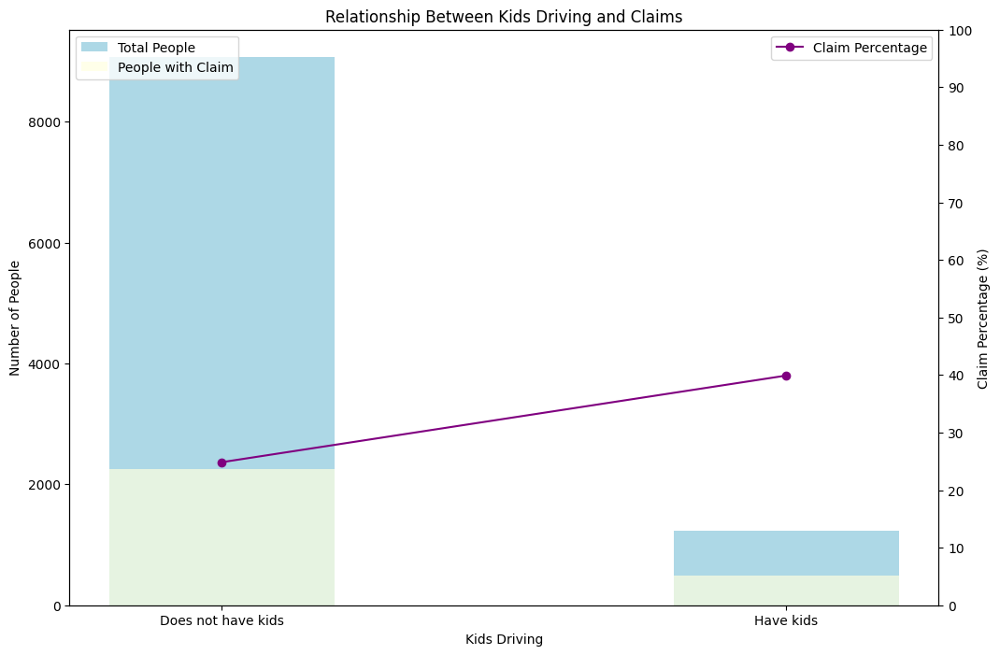

In [296]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each KIDSDRIV group
ax1.bar(kidsdriv_claim_analysis.index, kidsdriv_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(kidsdriv_claim_analysis.index, kidsdriv_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(kidsdriv_claim_analysis.index, kidsdriv_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Kids Driving')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Kids Driving and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### People tend to file less claims after getting married 

In [297]:
mstatus_claim_analysis = new_df.groupby(['MSTATUS', 'CLAIM_FLAG']).size().unstack(fill_value=0)
mstatus_claim_analysis['Total'] = mstatus_claim_analysis.sum(axis=1)
mstatus_claim_analysis['Claim_Percentage'] = (mstatus_claim_analysis[1] / mstatus_claim_analysis['Total']) * 100

# Display the result
mstatus_claim_analysis

CLAIM_FLAG,0,1,Total,Claim_Percentage
MSTATUS,,,,
No,2728,1386,4114,33.689840
Yes,4828,1360,6188,21.978022


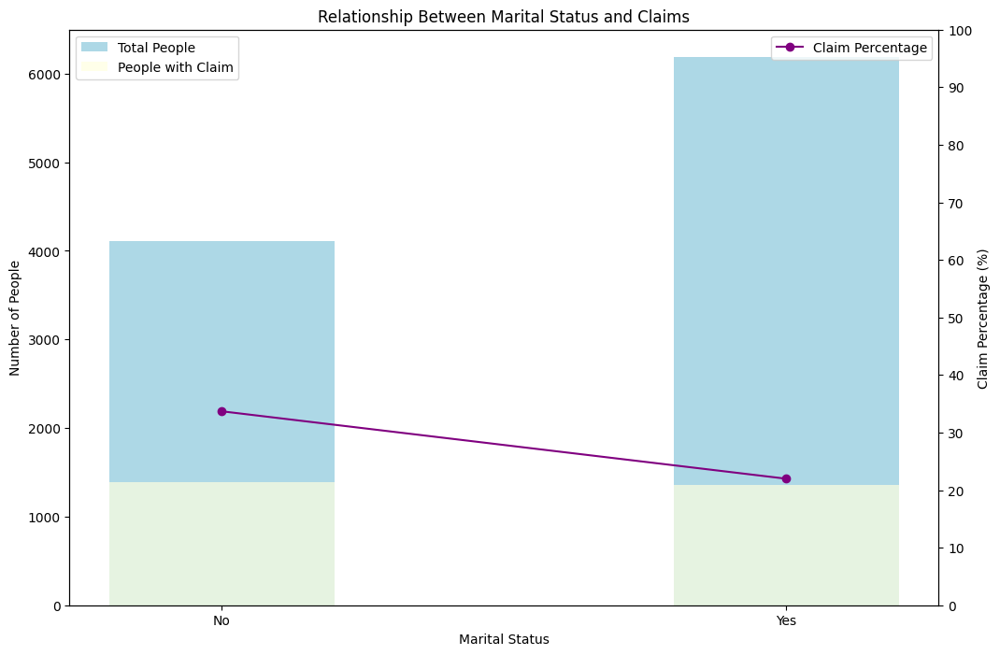

In [298]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each marital status group
ax1.bar(mstatus_claim_analysis.index, mstatus_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(mstatus_claim_analysis.index, mstatus_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(mstatus_claim_analysis.index, mstatus_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('Marital Status')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Marital Status and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

### iMore Traffic Tickets, More Crashes: A Dangerous Connection

In [299]:
# Define custom bins for MVR_PTS
bins = [0, 2, 5, 8, 10, 13]
labels = ['0-2', '3-5', '6-8', '9-10', '11-13']

# Create MVR_PTS_GROUP based on these bins
new_df['MVR_PTS_GROUP'] = pd.cut(new_df['MVR_PTS'], bins=bins, labels=labels, include_lowest=True)

# Group by the binned MVR_PTS and CLAIM_FLAG, then calculate totals and percentages
mvr_pts_claim_analysis = new_df.groupby(['MVR_PTS_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
mvr_pts_claim_analysis['Total'] = mvr_pts_claim_analysis.sum(axis=1)
mvr_pts_claim_analysis['Claim_Percentage'] = (mvr_pts_claim_analysis[1] / mvr_pts_claim_analysis['Total']) * 100
mvr_pts_claim_analysis

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/2942839681.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
MVR_PTS_GROUP,,,,
0-2,5749,1575,7324,21.504642
3-5,1445,776,2221,34.939217
6-8,341,327,668,48.952096
9-10,18,55,73,75.342466
11-13,3,13,16,81.250000


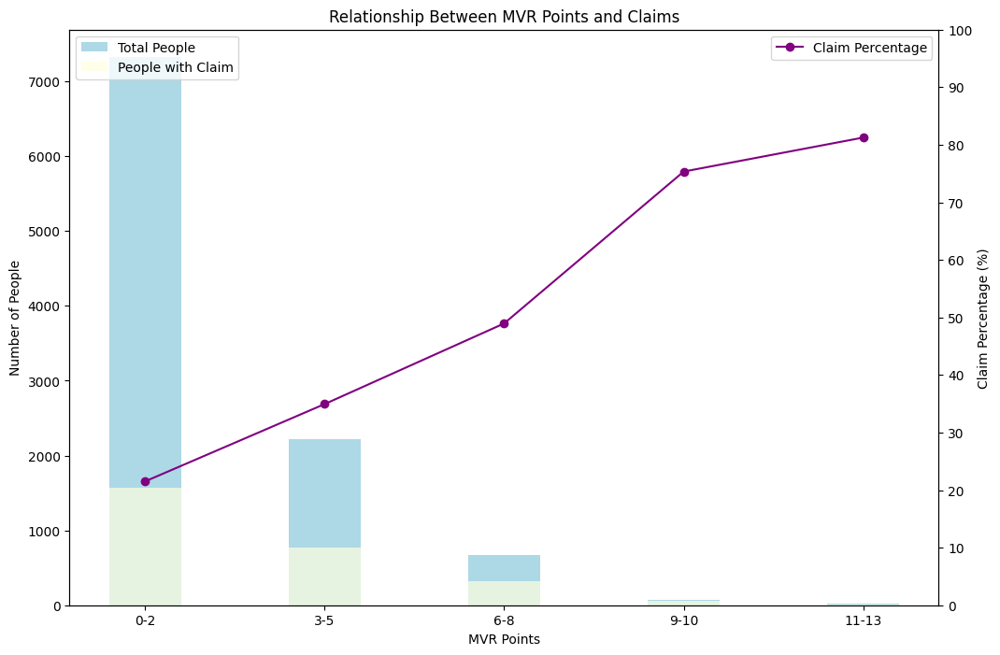

In [300]:
# Plotting the results
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for the total number of people in each MVR_PTS group
ax1.bar(mvr_pts_claim_analysis.index, mvr_pts_claim_analysis['Total'], color='lightblue', label='Total People', width=0.4)

# Bar plot for the number of people with CLAIM_FLAG = 1
ax1.bar(mvr_pts_claim_analysis.index, mvr_pts_claim_analysis[1], color='lightyellow', label='People with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(mvr_pts_claim_analysis.index, mvr_pts_claim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels
ax1.set_xlabel('MVR Points')
ax1.set_ylabel('Number of People')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between MVR Points and Claims')
ax2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()

In [301]:
!pip install plotly


In [302]:
# Separate zero and non-zero OLDCLAIM values
zero_oldclaim = new_df[new_df['OLDCLAIM'] == 0]
non_zero_oldclaim = new_df[new_df['OLDCLAIM'] > 0]

# Analyze the zero OLDCLAIM group
zero_oldclaim_analysis = zero_oldclaim.groupby('CLAIM_FLAG').size().reset_index(name='Count')
zero_oldclaim_analysis['Total'] = zero_oldclaim_analysis['Count'].sum()
zero_oldclaim_analysis['Claim_Percentage'] = (zero_oldclaim_analysis['Count'] / zero_oldclaim_analysis['Total']) * 100

# Group non-zero OLDCLAIM into quantiles and label them according to price ranges
quantiles = pd.qcut(non_zero_oldclaim['OLDCLAIM'], q=5)
labels = quantiles.apply(lambda x: f"${int(x.left):,} - ${int(x.right):,}")

non_zero_oldclaim['OLDCLAIM_GROUP'] = labels

# Analyze the non-zero OLDCLAIM groups
non_zero_oldclaim_analysis = non_zero_oldclaim.groupby(['OLDCLAIM_GROUP', 'CLAIM_FLAG']).size().reset_index(name='Count')
non_zero_oldclaim_totals = non_zero_oldclaim_analysis.groupby('OLDCLAIM_GROUP')['Count'].sum().reset_index(name='Total')
non_zero_oldclaim_analysis = pd.merge(non_zero_oldclaim_analysis, non_zero_oldclaim_totals, on='OLDCLAIM_GROUP')
non_zero_oldclaim_analysis['Claim_Percentage'] = (non_zero_oldclaim_analysis['Count'] / non_zero_oldclaim_analysis['Total']) * 100

# Display the results
print("Analysis for OLDCLAIM = 0:")
zero_oldclaim_analysis

Analysis for OLDCLAIM = 0:


/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/3092449081.py:17: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/3092449081.py:18: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,CLAIM_FLAG,Count,Total,Claim_Percentage
0,0,5169,6292,82.151939
1,1,1123,6292,17.848061


In [303]:
print("Analysis for OLDCLAIM = 0:")
non_zero_oldclaim_analysis

Analysis for OLDCLAIM = 0:


,OLDCLAIM_GROUP,CLAIM_FLAG,Count,Total,Claim_Percentage
0,"$501 - $3,136",0,479,802,59.725686
1,"$501 - $3,136",1,323,802,40.274314
2,"$3,136 - $5,043",0,469,802,58.478803
3,"$3,136 - $5,043",1,333,802,41.521197
4,"$5,043 - $7,106",0,490,802,61.097257
5,"$5,043 - $7,106",1,312,802,38.902743
6,"$7,106 - $12,909",0,471,802,58.728180
7,"$7,106 - $12,909",1,331,802,41.271820
8,"$12,909 - $57,037",0,478,802,59.600998
9,"$12,909 - $57,037",1,324,802,40.399002


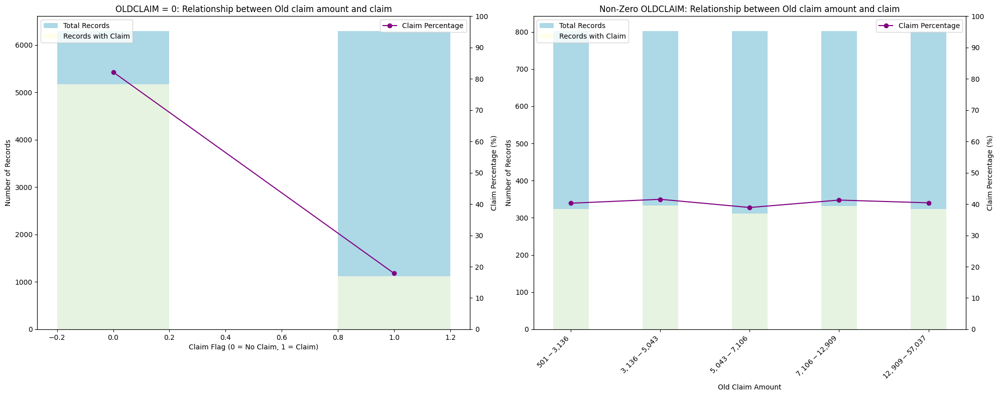

In [304]:
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the results for OLDCLAIM = 0
# Bar plot for the total number of records in OLDCLAIM = 0
ax1.bar(zero_oldclaim_analysis['CLAIM_FLAG'], zero_oldclaim_analysis['Total'], color='lightblue', label='Total Records', width=0.4)

# Bar plot for the number of records with CLAIM_FLAG = 1
ax1.bar(zero_oldclaim_analysis['CLAIM_FLAG'], zero_oldclaim_analysis['Count'], color='lightyellow', label='Records with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims
ax1_2 = ax1.twinx()
ax1_2.plot(zero_oldclaim_analysis['CLAIM_FLAG'], zero_oldclaim_analysis['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels for the first plot
ax1.set_xlabel('Claim Flag (0 = No Claim, 1 = Claim)')
ax1.set_ylabel('Number of Records')
ax1_2.set_ylabel('Claim Percentage (%)')
ax1.set_title('OLDCLAIM = 0: Relationship between Old claim amount and claim')
ax1_2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title for the first plot
ax1.legend(loc='upper left')
ax1_2.legend(loc='upper right')

# For the non-zero OLDCLAIM plot, filter only for CLAIM_FLAG = 1 for the line plot
claim_flag_1 = non_zero_oldclaim_analysis[non_zero_oldclaim_analysis['CLAIM_FLAG'] == 1]

# Plotting the results for non-zero OLDCLAIM
# Bar plot for the total number of records in each OLDCLAIM_GROUP
ax2.bar(non_zero_oldclaim_analysis['OLDCLAIM_GROUP'].unique(), non_zero_oldclaim_analysis['Total'].unique(), color='lightblue', label='Total Records', width=0.4)

# Bar plot for the number of records with CLAIM_FLAG = 1
ax2.bar(claim_flag_1['OLDCLAIM_GROUP'], claim_flag_1['Count'], color='lightyellow', label='Records with Claim', alpha=0.7, width=0.4)

# Line plot for the percentage of claims only when CLAIM_FLAG = 1
ax2_2 = ax2.twinx()
ax2_2.plot(claim_flag_1['OLDCLAIM_GROUP'], claim_flag_1['Claim_Percentage'], marker='o', color='purple', label='Claim Percentage')

# Setting titles and labels for the second plot
ax2.set_xlabel('Old Claim Amount')
ax2.set_ylabel('Number of Records')
ax2_2.set_ylabel('Claim Percentage (%)')
ax2.set_title('Non-Zero OLDCLAIM: Relationship between Old claim amount and claim')
ax2_2.set_yticks(np.arange(0, 101, 10))
# Adding legends without a title for the second plot
ax2.legend(loc='upper left')
ax2_2.legend(loc='upper right')

# Rotate x-axis labels for better readability on the second plot
plt.setp(ax2.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()


### Claims are slightly influenced by the color of car being red, but not too much!.Minivans tend to be the safest and file least no of claims

In [305]:
import pandas as pd

# Analyze the relationship between RED_CAR, CAR_TYPE, and CLAIM_FLAG
red_car_analysis = new_df.groupby(['RED_CAR', 'CAR_TYPE', 'CLAIM_FLAG']).size().unstack(fill_value=0)
red_car_analysis['Total'] = red_car_analysis.sum(axis=1)
red_car_analysis['Claim_Percentage'] = (red_car_analysis[1] / red_car_analysis['Total']) * 100

# Display the results
red_car_analysis


CLAIM_FLAG              0    1  Total  Claim_Percentage
RED_CAR CAR_TYPE                                       
no      Minivan      1321  268   1589         16.865953
        Panel Truck   259   90    349         25.787966
        Pickup        692  293    985         29.746193
        SUV          2007  822   2829         29.056204
        Sports Car    751  390   1141         34.180543
        Van           328  105    433         24.249423
yes     Minivan       908  197   1105         17.828054
        Panel Truck   369  135    504         26.785714
        Pickup        525  262    787         33.290978
        SUV            35   19     54         35.185185
        Sports Car     20   18     38         47.368421
        Van           341  147    488         30.122951

### Having your license revoked previously increases the likelihood of filing more claims

In [306]:
# Analyze the relationship between REVOKED and CLAIM_FLAG
revoked_claim_analysis = new_df.groupby(['REVOKED', 'CLAIM_FLAG']).size().unstack(fill_value=0)
revoked_claim_analysis['Total'] = revoked_claim_analysis.sum(axis=1)
revoked_claim_analysis['Claim_Percentage'] = (revoked_claim_analysis[1] / revoked_claim_analysis['Total']) * 100

# Display the results
revoked_claim_analysis


CLAIM_FLAG,0,1,Total,Claim_Percentage
REVOKED,,,,
No,6864,2177,9041,24.079195
Yes,692,569,1261,45.122918


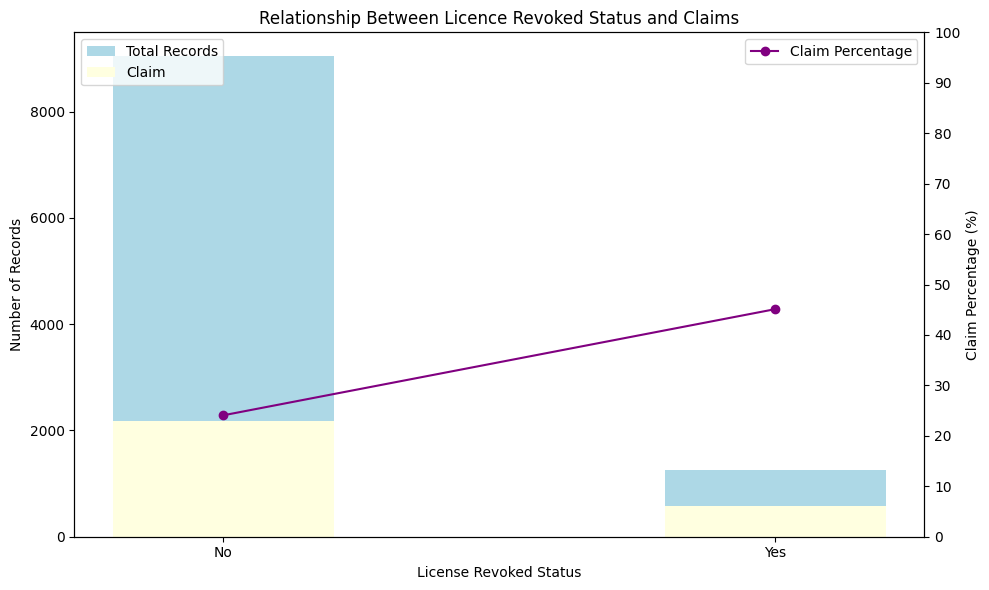

In [307]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for the total number of records in each REVOKED status
total_bars = ax1.bar(
    revoked_claim_analysis.index, 
    revoked_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=0.4
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top of the total
claim_bars = ax1.bar(
    revoked_claim_analysis.index, 
    revoked_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=0.4
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    revoked_claim_analysis.index, 
    revoked_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('License Revoked Status')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Licence Revoked Status and Claims')

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

ax2.set_yticks(np.arange(0, 101, 10))
# Set x-axis labels for REVOKED (Yes or No)
ax1.set_xticks(revoked_claim_analysis.index)
ax1.set_xticklabels(['No', 'Yes'])

plt.tight_layout()
plt.show()


### Gender doesnt seem to have any significant impact on the filing of claims

In [308]:
import pandas as pd

gender_claim_analysis = new_df.groupby(['GENDER', 'CLAIM_FLAG']).size().unstack(fill_value=0)
gender_claim_analysis['Total'] = gender_claim_analysis.sum(axis=1)
gender_claim_analysis['Claim_Percentage'] = (gender_claim_analysis[1] / gender_claim_analysis['Total']) * 100

# Display the results
gender_claim_analysis
#gender wise analysis on young age(if education is high school or < high school)

CLAIM_FLAG,0,1,Total,Claim_Percentage
GENDER,,,,
F,4017,1528,5545,27.556357
M,3539,1218,4757,25.604373


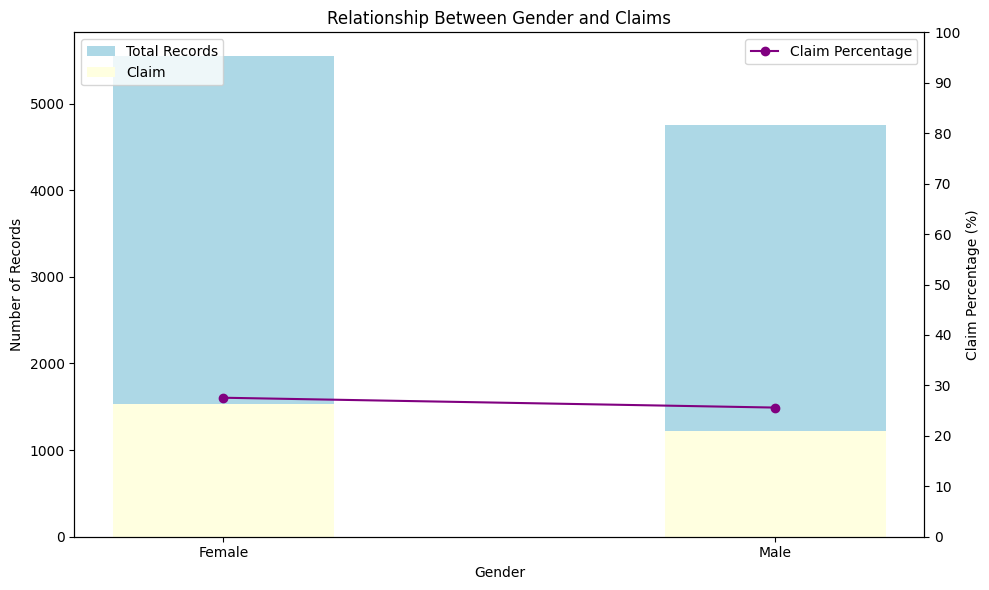

In [309]:
# Create a figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for the total number of records in each GENDER group
total_bars = ax1.bar(
    gender_claim_analysis.index, 
    gender_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=0.4
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top of the total
claim_bars = ax1.bar(
    gender_claim_analysis.index, 
    gender_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=0.4
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    gender_claim_analysis.index, 
    gender_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('Gender')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Gender and Claims')

# Set y-axis ticks for the percentage to be at intervals of 10
ax2.set_yticks(np.arange(0, 101, 10))

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Set x-axis labels for GENDER
ax1.set_xticks(gender_claim_analysis.index)
ax1.set_xticklabels(['Female', 'Male'])

plt.tight_layout()
plt.show()

In [324]:
# Gender-education distribution
gender_claim_analysis = new_df.groupby(['GENDER','EDUCATION', 'CLAIM_FLAG']).size().unstack(fill_value=0)
gender_claim_analysis['Total'] = gender_claim_analysis.sum(axis=1)
gender_claim_analysis['Claim_Percentage'] = (gender_claim_analysis[1] / gender_claim_analysis['Total']) * 100

# Display the results
gender_claim_analysis

CLAIM_FLAG              0    1  Total  Claim_Percentage
GENDER EDUCATION                                       
F      <High School   559  270    829         32.569361
       Bachelors     1149  367   1516         24.208443
       High School   1092  594   1686         35.231317
       Masters        821  210   1031         20.368574
       PhD            396   87    483         18.012422
M      <High School   464  222    686         32.361516
       Bachelors     1001  306   1307         23.412395
       High School    837  429   1266         33.886256
       Masters        853  194   1047         18.529131
       PhD            384   67    451         14.855876

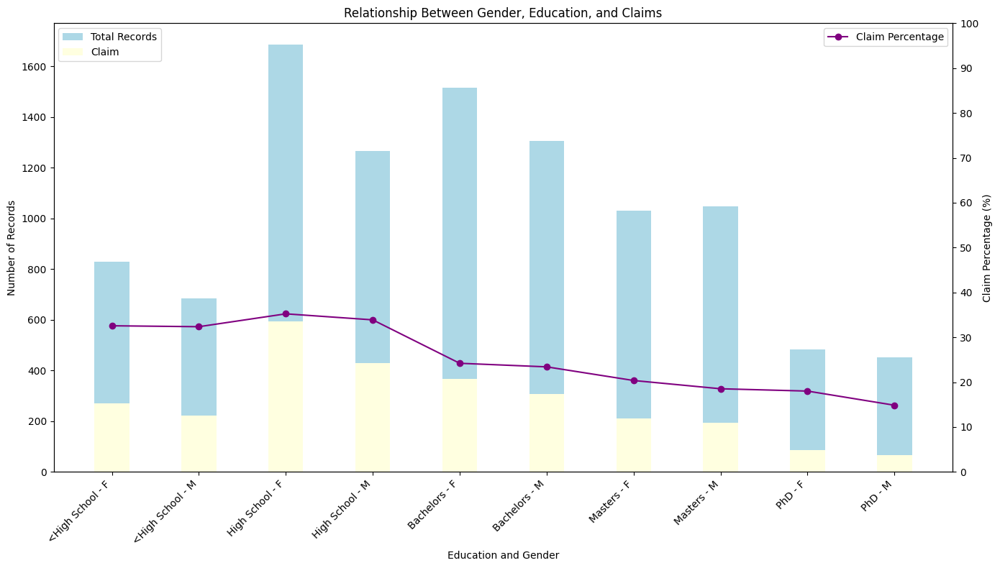

In [325]:
import matplotlib.pyplot as plt
import numpy as np

# Reset the index, ensuring no conflict with existing column names

# Reset the index to flatten the multi-index without adding the index as a column
gender_claim_analysis = gender_claim_analysis.reset_index()

# Sort the DataFrame to ensure correct order of Education first, then Gender
education_order = {'<High School': 0, 'High School': 1, 'Bachelors': 2, 'Masters': 3, 'PhD': 4}
gender_order = {'Female': 0, 'Male': 1}

# Create temporary columns to store the order
gender_claim_analysis['EDUCATION_order'] = gender_claim_analysis['EDUCATION'].map(education_order)
gender_claim_analysis['GENDER_order'] = gender_claim_analysis['GENDER'].map(gender_order)

# Sort by the custom order columns
gender_claim_analysis = gender_claim_analysis.sort_values(by=['EDUCATION_order', 'GENDER_order'])

# Drop the temporary order columns if no longer needed
gender_claim_analysis = gender_claim_analysis.drop(columns=['EDUCATION_order', 'GENDER_order'])

# Define the width of the bars
bar_width = 0.4

# Calculate positions for the bars
positions = np.arange(len(gender_claim_analysis))

# Create a figure
fig, ax1 = plt.subplots(figsize=(14, 8))

# Bar plot for the total number of records (No Claim + Claim)
total_bars = ax1.bar(
    positions, 
    gender_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=bar_width
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top
claim_bars = ax1.bar(
    positions, 
    gender_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=bar_width
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    positions, 
    gender_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('Education and Gender')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Gender, Education, and Claims')

# Set y-axis ticks for the percentage to be at intervals of 10
ax2.set_yticks(np.arange(0, 101, 10))

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Set x-axis labels for GENDER and EDUCATION
ax1.set_xticks(positions)
ax1.set_xticklabels(
    gender_claim_analysis['EDUCATION'] + ' - ' + gender_claim_analysis['GENDER'],
    rotation=45, 
    ha="right"
)

plt.tight_layout()
plt.show()


### people who have been customers for a long time are usually more safe and file less claims

In [188]:

bins = [0, 1, 3, 5, 10, new_df['TIF'].max()]
labels = ['0-1 year', '1-3 years', '3-5 years', '5-10 years', '10+ years']


new_df['TIF_GROUP'] = pd.cut(new_df['TIF'], bins=bins, labels=labels, right=False)

tif_claim_analysis = new_df.groupby(['TIF_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
tif_claim_analysis['Total'] = tif_claim_analysis.sum(axis=1)
tif_claim_analysis['Claim_Percentage'] = (tif_claim_analysis[1] / tif_claim_analysis['Total']) * 100

# Display the results
tif_claim_analysis


/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/3226052308.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
TIF_GROUP,,,,
0-1 year,0,0,0,NaN
1-3 years,2179,999,3178,31.434865
3-5 years,1553,594,2147,27.666511
5-10 years,2224,716,2940,24.353741
10+ years,1597,437,2034,21.484759


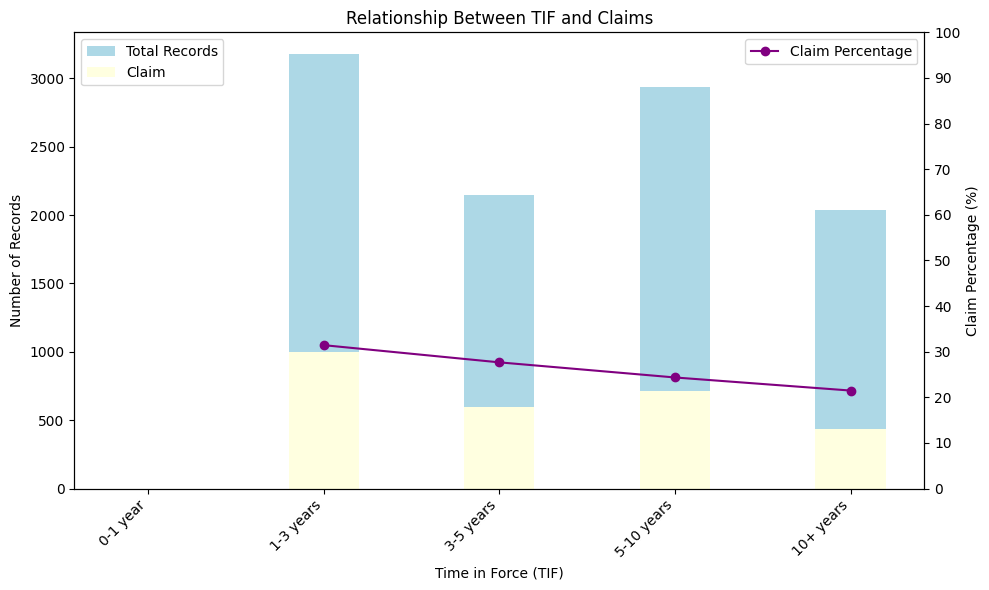

In [205]:
import matplotlib.pyplot as plt
import numpy as np

# Define the width of the bars
bar_width = 0.4

# Calculate positions for the bars
positions = np.arange(len(tif_claim_analysis))

# Create a figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for the total number of records in each TIF_GROUP
total_bars = ax1.bar(
    positions, 
    tif_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=bar_width
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top of the total
claim_bars = ax1.bar(
    positions, 
    tif_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=bar_width
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    positions, 
    tif_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('Time in Force (TIF)')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between TIF and Claims')

# Set y-axis ticks for the percentage to be at intervals of 10
ax2.set_yticks(np.arange(0, 101, 10))

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Set x-axis labels for TIF_GROUP
ax1.set_xticks(positions)
ax1.set_xticklabels(tif_claim_analysis.index, rotation=45, ha="right")

plt.tight_layout()
plt.show()


In [197]:
bins = [0, 10, 20, 30,40,50,60, new_df['TRAVTIME'].max()]
labels = ['0-10 min', '10-20 min', '20-30 min', '30-40 min','40-50 min','50-60 min','60+ min']

new_df['TRAVTIME_GROUP'] = pd.cut(new_df['TRAVTIME'], bins=bins, labels=labels, right=False)

# Analyze the relationship between TRAVTIME_GROUP and CLAIM_FLAG
travtime_claim_analysis = new_df.groupby(['TRAVTIME_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
travtime_claim_analysis['Total'] = travtime_claim_analysis.sum(axis=1)
travtime_claim_analysis['Claim_Percentage'] = (travtime_claim_analysis[1] / travtime_claim_analysis['Total']) * 100

# Display the results
travtime_claim_analysis

#cut to qcut and make more bins to have a better look at the data

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/4227079453.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
TRAVTIME_GROUP,,,,
0-10 min,558,146,704,20.738636
10-20 min,1005,308,1313,23.457730
20-30 min,1674,577,2251,25.633052
30-40 min,1888,681,2569,26.508369
40-50 min,1354,560,1914,29.258098
50-60 min,672,318,990,32.121212
60+ min,404,156,560,27.857143


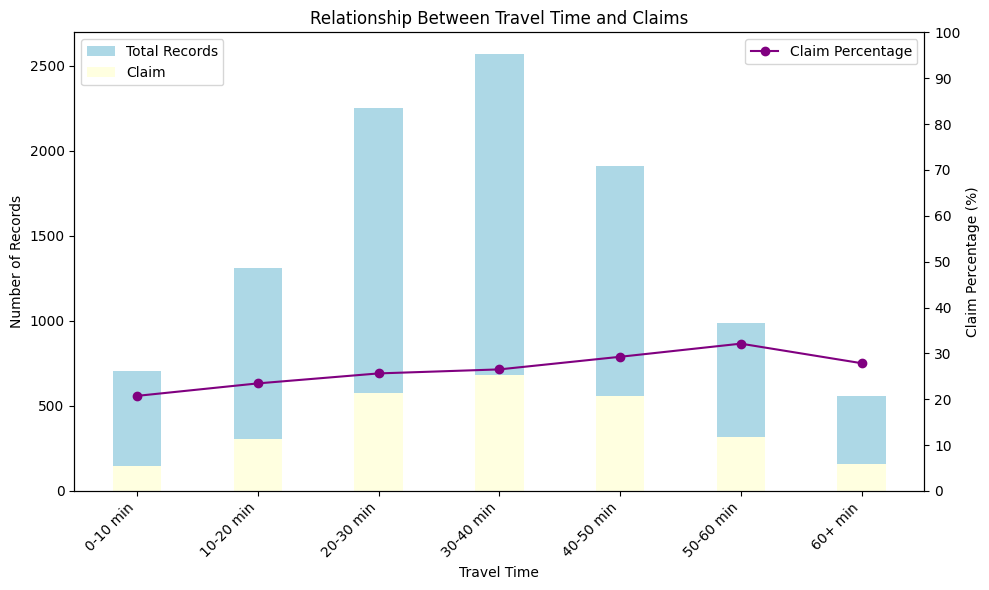

In [204]:

# Define the width of the bars
bar_width = 0.4

# Calculate positions for the bars
positions = np.arange(len(travtime_claim_analysis))

# Create a figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for the total number of records in each TRAVTIME_GROUP
total_bars = ax1.bar(
    positions, 
    travtime_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=bar_width
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top of the total
claim_bars = ax1.bar(
    positions, 
    travtime_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=bar_width
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    positions, 
    travtime_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('Travel Time')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Travel Time and Claims')

# Set y-axis ticks for the percentage to be at intervals of 10
ax2.set_yticks(np.arange(0, 101, 10))

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Set x-axis labels for TRAVTIME_GROUP
ax1.set_xticks(positions)
ax1.set_xticklabels(travtime_claim_analysis.index, rotation=45, ha="right")

plt.tight_layout()
plt.show()


#### people who stay on job for a long time are usually more safe(Note:seems not much relevant as data points for rest of the graph are too less)

In [200]:
import pandas as pd


bins = [0, 2, 5, 10,13, new_df['YOJ'].max()]
labels = ['0-2 years', '2-5 years', '5-10 years','10-13 years', '13+ years']


new_df['YOJ_GROUP'] = pd.cut(new_df['YOJ'], bins=bins, labels=labels, right=False)
yoj_claim_analysis = new_df.groupby(['YOJ_GROUP', 'CLAIM_FLAG']).size().unstack(fill_value=0)
yoj_claim_analysis['Total'] = yoj_claim_analysis.sum(axis=1)
yoj_claim_analysis['Claim_Percentage'] = (yoj_claim_analysis[1] / yoj_claim_analysis['Total']) * 100

yoj_claim_analysis

/var/folders/84/p0lgs0r14rj_fjn4ptm8lntr0000gn/T/ipykernel_90875/408637813.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



CLAIM_FLAG,0,1,Total,Claim_Percentage
YOJ_GROUP,,,,
0-2 years,565,349,914,38.183807
2-5 years,86,22,108,20.370370
5-10 years,1359,505,1864,27.092275
10-13 years,3089,1060,4149,25.548325
13+ years,2455,810,3265,24.808576


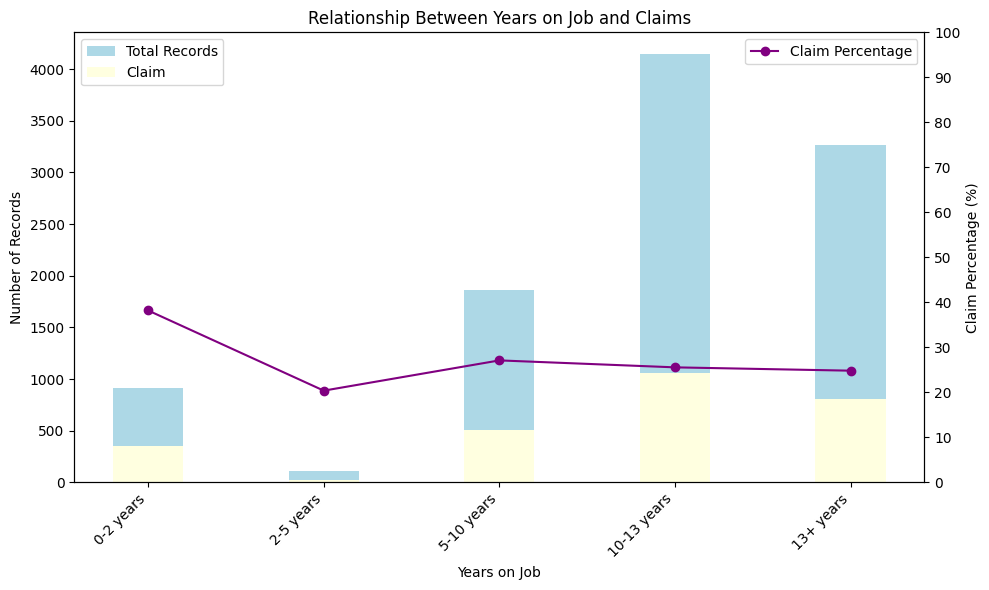

In [203]:
# Define the width of the bars
bar_width = 0.4

# Calculate positions for the bars
positions = np.arange(len(yoj_claim_analysis))

# Create a figure
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot for the total number of records in each YOJ_GROUP
total_bars = ax1.bar(
    positions, 
    yoj_claim_analysis['Total'], 
    color='lightblue', 
    label='Total Records', 
    width=bar_width
)

# Bar plot for the number of records with CLAIM_FLAG = 1, stacked on top of the total
claim_bars = ax1.bar(
    positions, 
    yoj_claim_analysis[1], 
    color='lightyellow', 
    label='Claim', 
    width=bar_width
)

# Line plot for the percentage of claims
ax2 = ax1.twinx()
ax2.plot(
    positions, 
    yoj_claim_analysis['Claim_Percentage'], 
    marker='o', 
    color='purple', 
    label='Claim Percentage'
)

# Setting titles and labels
ax1.set_xlabel('Years on Job')
ax1.set_ylabel('Number of Records')
ax2.set_ylabel('Claim Percentage (%)')
ax1.set_title('Relationship Between Years on Job and Claims')

# Set y-axis ticks for the percentage to be at intervals of 10
ax2.set_yticks(np.arange(0, 101, 10))

# Adding legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Set x-axis labels for YOJ_GROUP
ax1.set_xticks(positions)
ax1.set_xticklabels(yoj_claim_analysis.index, rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [202]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np



insights = []

claim_flag_dist = new_df['CLAIM_FLAG'].value_counts()
insights.append("1. The distribution of CLAIM_FLAG shows a significant class imbalance, with the majority of the instances being non-claimants (CLAIM_FLAG=0).")

claim_flag_dist_plot = px.bar(claim_flag_dist, x=claim_flag_dist.index, y=claim_flag_dist.values, 
                              labels={'index': 'CLAIM_FLAG', 'y': 'Count'},
                              title="Distribution of CLAIM_FLAG")
age_distribution = new_df['AGE'].describe()
insights.append(f"2. The average age of the individuals in the new_df is around {age_distribution['mean']:.1f} years, with a median of {age_distribution['50%']} years. The age distribution is fairly spread out from {age_distribution['min']} to {age_distribution['max']} years.")

age_claim_plot = px.histogram(new_df, x="AGE", color="CLAIM_FLAG", barmode="overlay",
                              title="Distribution of Age by CLAIM_FLAG")

income_distribution = new_df['INCOME'].describe()
insights.append(f"3. The average income in the new_df is approximately ${income_distribution['mean']:.2f}. Income has a long tail with some very high values.")

income_claim_plot = px.histogram(new_df, x="INCOME", color="CLAIM_FLAG", barmode="overlay",
                                 title="Distribution of Income by CLAIM_FLAG")

home_value_distribution = new_df['HOME_VAL'].describe()
insights.append(f"4. The average home value is ${home_value_distribution['mean']:.2f}, but many individuals have a home value of $0, indicating they might not own a home.")

home_value_claim_plot = px.histogram(new_df, x="HOME_VAL", color="CLAIM_FLAG", barmode="overlay",
                                     title="Distribution of Home Value by CLAIM_FLAG")

education_levels = new_df['EDUCATION'].value_counts()
insights.append(f"5. Most individuals in the dfset have a high school diploma, followed by those with a bachelor's degree. This could have an effect on their financial behavior and risk profile.")

education_levels_plot = px.bar(education_levels, x=education_levels.index, y=education_levels.values,
                               labels={'index': 'Education Level', 'y': 'Count'},
                               title="Distribution of Education Levels")

car_age_distribution = new_df['CAR_AGE'].describe()
insights.append(f"6. The average car age in the dfset is {car_age_distribution['mean']:.1f} years. There seems to be a relationship between older cars and higher claim frequency.")

car_age_claim_plot = px.histogram(new_df, x="CAR_AGE", color="CLAIM_FLAG", barmode="overlay",
                                  title="Distribution of Car Age by CLAIM_FLAG")

travel_time_distribution = new_df['TRAVTIME'].describe()
insights.append(f"7. The average travel time for individuals is {travel_time_distribution['mean']:.1f} minutes. Longer travel times may increase exposure to accidents, thereby affecting CLAIM_FLAG.")

travel_time_claim_plot = px.histogram(new_df, x="TRAVTIME", color="CLAIM_FLAG", barmode="overlay",
                                      title="Distribution of Travel Time by CLAIM_FLAG")

marital_status_distribution = dnew_dff['MSTATUS'].value_counts()
insights.append("8. A significant majority of the individuals in the dfset are not married. Marital status could influence claim behavior.")

marital_status_plot = px.bar(marital_status_distribution, x=marital_status_distribution.index, y=marital_status_distribution.values,
                             labels={'index': 'Marital Status', 'y': 'Count'},
                             title="Distribution of Marital Status")


car_use_distribution = new_df['CAR_USE'].value_counts()
insights.append("9. Most vehicles are used for private purposes, but commercial vehicles have a higher claim frequency.")

car_use_plot = px.bar(car_use_distribution, x=car_use_distribution.index, y=car_use_distribution.values,
                      labels={'index': 'Car Use', 'y': 'Count'},
                      title="Distribution of Car Use (Commercial/Private)")

urbanicity_distribution = new_df['URBANICITY'].value_counts()
insights.append("10. The majority of the individuals live in urban or highly urban areas, which might influence driving patterns and claim frequency.")

urbanicity_plot = px.bar(urbanicity_distribution, x=urbanicity_distribution.index, y=urbanicity_distribution.values,
                         labels={'index': 'Urbanicity', 'y': 'Count'},
                         title="Distribution of Urbanicity")

# Display all plots in a sequence
plots = [
    claim_flag_dist_plot,
    age_claim_plot,
    income_claim_plot,
    home_value_claim_plot,
    education_levels_plot,
    car_age_claim_plot,
    travel_time_claim_plot,
    marital_status_plot,
    car_use_plot,
    urbanicity_plot
]

plots, insights


([Figure({
      'data': [{'alignmentgroup': 'True',
                'hovertemplate': 'CLAIM_FLAG=%{x}<br>Count=%{y}<extra></extra>',
                'legendgroup': '',
                'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
                'name': '',
                'offsetgroup': '',
                'orientation': 'v',
                'showlegend': False,
                'textposition': 'auto',
                'type': 'bar',
                'x': array([0, 1]),
                'xaxis': 'x',
                'y': array([7556, 2746]),
                'yaxis': 'y'}],
      'layout': {'barmode': 'relative',
                 'legend': {'tracegroupgap': 0},
                 'template': '...',
                 'title': {'text': 'Distribution of CLAIM_FLAG'},
                 'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'CLAIM_FLAG'}},
                 'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'Count'}}}
  }),
  Figure({
      'data

C:\Users\Dell\AppData\Local\Temp\ipykernel_23564\3583304614.py:4: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



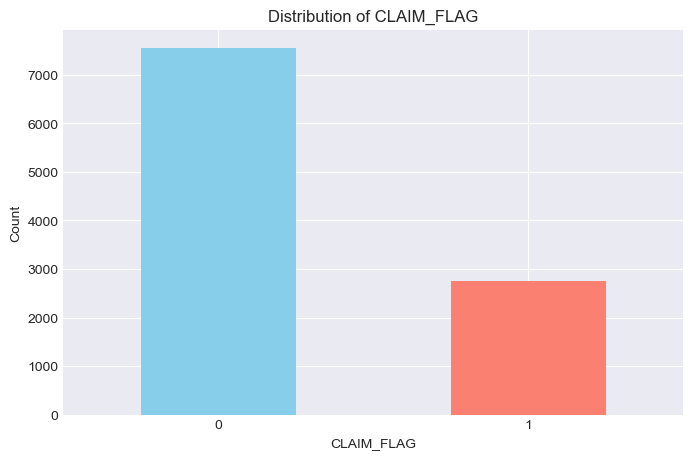

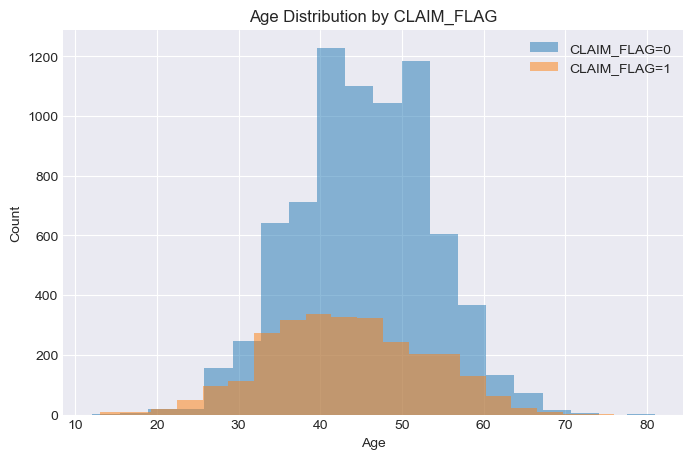

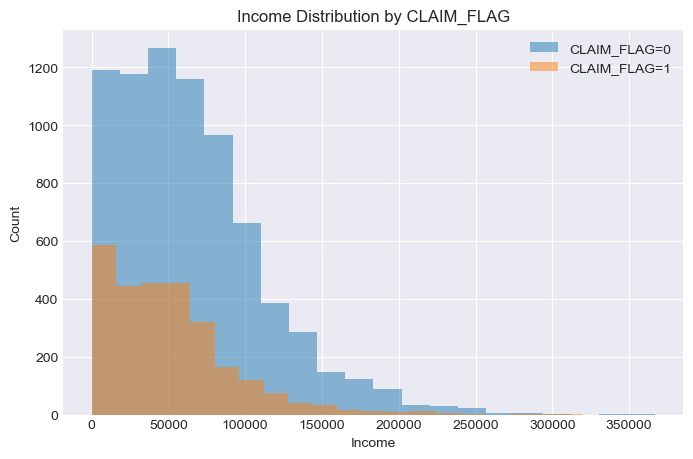

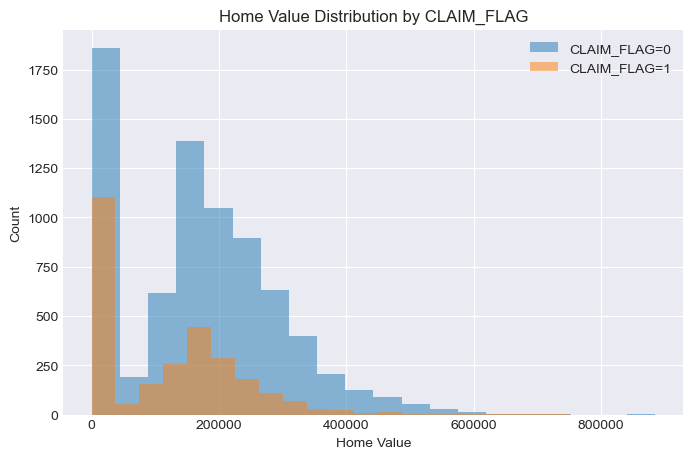

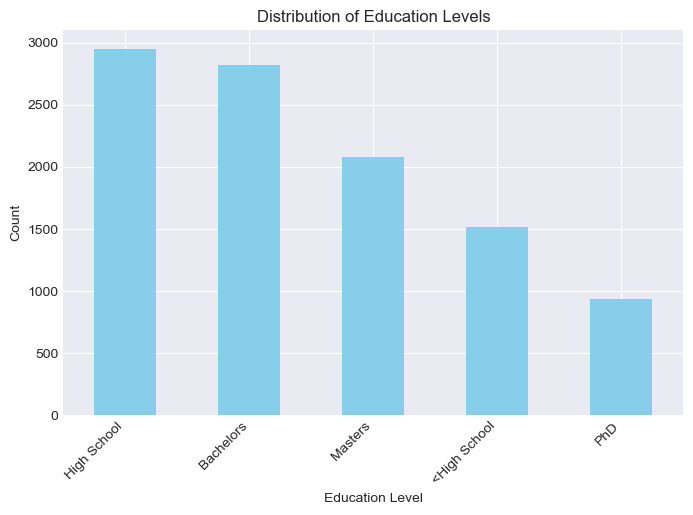

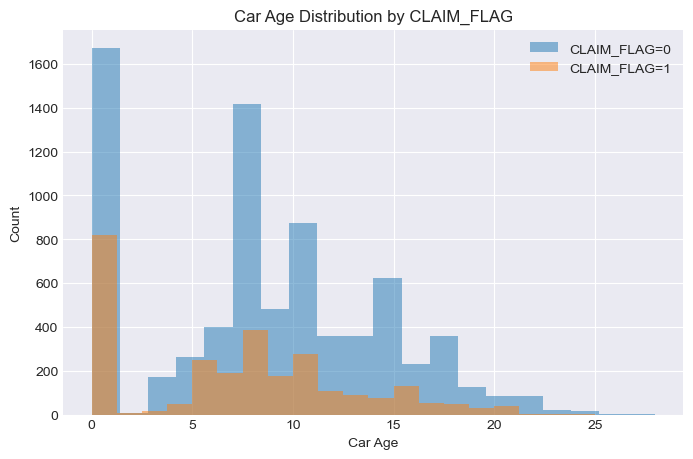

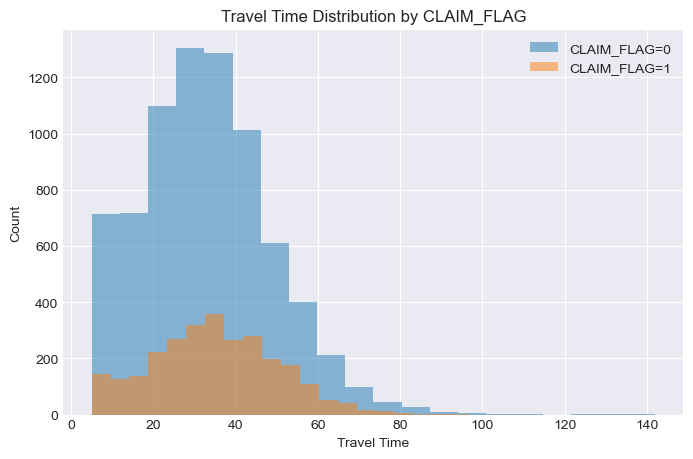

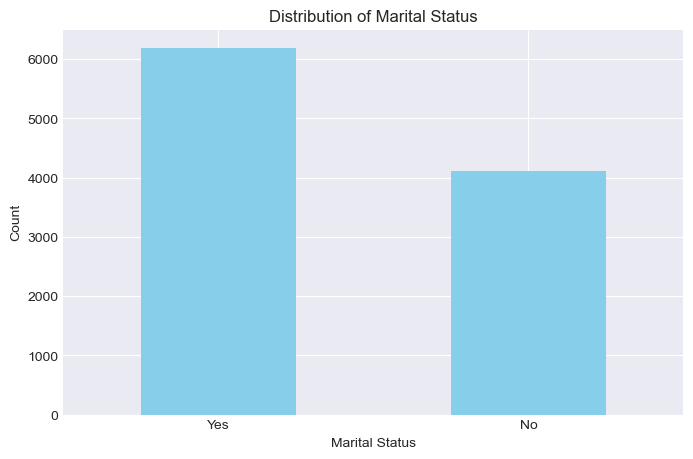

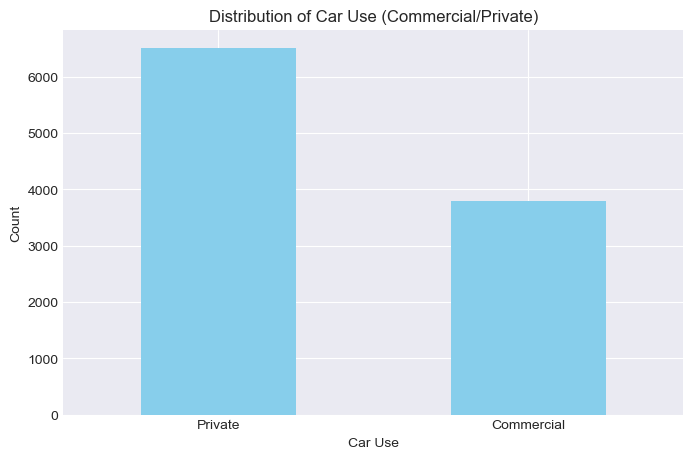

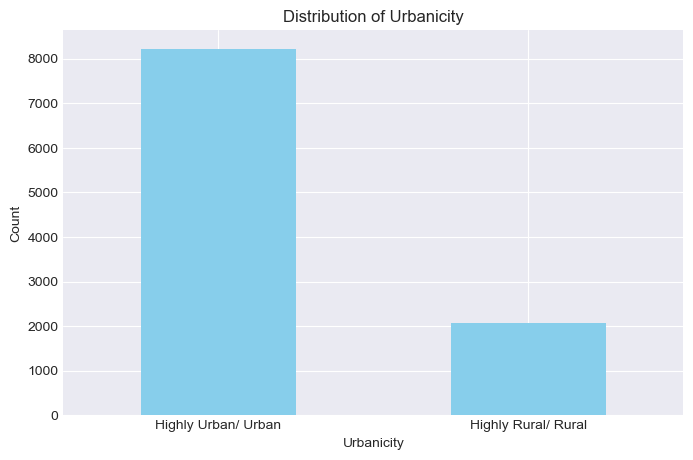

In [5]:
import matplotlib.pyplot as plt

# Set the style for the plots
plt.style.use('seaborn-darkgrid')

# 1. Distribution of CLAIM_FLAG
plt.figure(figsize=(8, 5))
new_df['CLAIM_FLAG'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribution of CLAIM_FLAG')
plt.xlabel('CLAIM_FLAG')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# 2. Age Distribution by CLAIM_FLAG
plt.figure(figsize=(8, 5))
for flag in new_df['CLAIM_FLAG'].unique():
    subset = new_df[new_df['CLAIM_FLAG'] == flag]
    plt.hist(subset['AGE'], bins=20, alpha=0.5, label=f'CLAIM_FLAG={flag}')
plt.title('Age Distribution by CLAIM_FLAG')
plt.xlabel('Age')
plt.ylabel('Count')
plt.legend()
plt.show()

# 3. Income Distribution by CLAIM_FLAG
plt.figure(figsize=(8, 5))
for flag in new_df['CLAIM_FLAG'].unique():
    subset = new_df[new_df['CLAIM_FLAG'] == flag]
    plt.hist(subset['INCOME'], bins=20, alpha=0.5, label=f'CLAIM_FLAG={flag}')
plt.title('Income Distribution by CLAIM_FLAG')
plt.xlabel('Income')
plt.ylabel('Count')
plt.legend()
plt.show()

# 4. Home Value Distribution by CLAIM_FLAG
plt.figure(figsize=(8, 5))
for flag in new_df['CLAIM_FLAG'].unique():
    subset = new_df[new_df['CLAIM_FLAG'] == flag]
    plt.hist(subset['HOME_VAL'], bins=20, alpha=0.5, label=f'CLAIM_FLAG={flag}')
plt.title('Home Value Distribution by CLAIM_FLAG')
plt.xlabel('Home Value')
plt.ylabel('Count')
plt.legend()
plt.show()

# 5. Education Levels
plt.figure(figsize=(8, 5))
new_df['EDUCATION'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Education Levels')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

# 6. Car Age Distribution by CLAIM_FLAG
plt.figure(figsize=(8, 5))
for flag in new_df['CLAIM_FLAG'].unique():
    subset = new_df[new_df['CLAIM_FLAG'] == flag]
    plt.hist(subset['CAR_AGE'], bins=20, alpha=0.5, label=f'CLAIM_FLAG={flag}')
plt.title('Car Age Distribution by CLAIM_FLAG')
plt.xlabel('Car Age')
plt.ylabel('Count')
plt.legend()
plt.show()

# 7. Travel Time Distribution by CLAIM_FLAG
plt.figure(figsize=(8, 5))
for flag in new_df['CLAIM_FLAG'].unique():
    subset = new_df[new_df['CLAIM_FLAG'] == flag]
    plt.hist(subset['TRAVTIME'], bins=20, alpha=0.5, label=f'CLAIM_FLAG={flag}')
plt.title('Travel Time Distribution by CLAIM_FLAG')
plt.xlabel('Travel Time')
plt.ylabel('Count')
plt.legend()
plt.show()

# 8. Marital Status Distribution
plt.figure(figsize=(8, 5))
new_df['MSTATUS'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# 9. Car Use Distribution
plt.figure(figsize=(8, 5))
new_df['CAR_USE'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Car Use (Commercial/Private)')
plt.xlabel('Car Use')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# 10. Urbanicity Distribution
plt.figure(figsize=(8, 5))
new_df['URBANICITY'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Urbanicity')
plt.xlabel('Urbanicity')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


  '1. The distribution of CLAIM_FLAG shows a significant class imbalance, with the majority of the instances being non-claimants (CLAIM_FLAG=0).',
  
  '2. The average age of the individuals in the dfset is around 44.8 years, with a median of 45.0 years. The age distribution is fairly spread out from 12.0 to 81.0 years.',
  
  '3. The average income in the dfset is approximately $60790.17. Income has a long tail with some very high values.',
  
  '4. The average home value is $153944.48,  but many individuals have a home value of $0, indicating they might not own a home.'
  
  "5. Most individuals in the dfset have a high school diploma, followed by those with a bachelor's degree. This could have an effect on their financial behavior and risk profile.",
  
  '6. The average car age in the dfset is 8.3 years. There seems to be a relationship between older cars and higher claim frequency.',
  
  '7. The average travel time for individuals is 33.4 minutes. Longer travel times may increase exposure to accidents, thereby affecting CLAIM_FLAG.',
  
  '8. A significant majority of the individuals in the dfset are not married. Marital status could influence claim behavior.',
  
  '9. Most vehicles are used for private purposes, but commercial vehicles have a higher claim frequency.',
  
  '10. The majority of the individuals live in urban or highly urban areas, which might influence driving patterns and claim frequency.

### Check if a column is categorical

In [34]:
df.loc[:3].T

,0,1,2,3
KIDSDRIV,0,0,0,0
AGE,60.0,43.0,48.0,35.0
HOMEKIDS,0,0,0,1
YOJ,11.0,11.0,11.0,10.0
INCOME,67349.0,91449.0,52881.0,16039.0
PARENT1,No,No,No,No
HOME_VAL,0.0,257252.0,0.0,124191.0
MSTATUS,No,No,No,Yes
GENDER,M,M,M,F
EDUCATION,PhD,High School,Bachelors,High School


Most categorical variables are nominal except for `EDUCATION`

In [35]:
df.EDUCATION.value_counts()

EDUCATION
High School     2952
Bachelors       2823
Masters         2078
<High School    1515
PhD              934
Name: count, dtype: int64

In [36]:
ord_encoder = preprocessing.OrdinalEncoder(categories=[['<High School', 'High School', 'Bachelors', 'Masters', 'PhD']])
df['EDUCATION'] = ord_encoder.fit_transform(df[['EDUCATION']])
df['EDUCATION'].value_counts()

EDUCATION
1.0    2952
2.0    2823
3.0    2078
0.0    1515
4.0     934
Name: count, dtype: int64

### One-hot encoding

In [37]:
cat_list = ['PARENT1', 'MSTATUS', 'GENDER', 'OCCUPATION', 'CAR_USE',  'CAR_TYPE', 'RED_CAR', 'REVOKED', 'URBANICITY']
formula = f"CLAIM_FLAG ~ 0 + {' + '.join([feature if feature not in cat_list else f'C({feature})' for feature in df.columns[df.columns != 'CLAIM_FLAG']])}"
formula

'CLAIM_FLAG ~ 0 + KIDSDRIV + AGE + HOMEKIDS + YOJ + INCOME + C(PARENT1) + HOME_VAL + C(MSTATUS) + C(GENDER) + EDUCATION + C(OCCUPATION) + TRAVTIME + C(CAR_USE) + BLUEBOOK + TIF + C(CAR_TYPE) + C(RED_CAR) + OLDCLAIM + CLM_FREQ + C(REVOKED) + MVR_PTS + CAR_AGE + C(URBANICITY) + BIRTH_YEAR + BIRTH_MONTH'

In [38]:
Y, X = dmatrices(formula, df, return_type='dataframe')

In [39]:
X.head()

,C(PARENT1)[No],C(PARENT1)[Yes],C(MSTATUS)[T.Yes],C(GENDER)[T.M],C(OCCUPATION)[T.Clerical],C(OCCUPATION)[T.Doctor],C(OCCUPATION)[T.Home Maker],C(OCCUPATION)[T.Lawyer],C(OCCUPATION)[T.Manager],C(OCCUPATION)[T.Professional],...,EDUCATION,TRAVTIME,BLUEBOOK,TIF,OLDCLAIM,CLM_FREQ,MVR_PTS,CAR_AGE,BIRTH_YEAR,BIRTH_MONTH
0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4.0,14.0,14230.0,11.0,4461.0,2.0,3.0,18.0,1939.0,3.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,22.0,14940.0,1.0,0.0,0.0,0.0,1.0,1956.0,1.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,2.0,26.0,21970.0,1.0,0.0,0.0,2.0,10.0,1951.0,11.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,5.0,4010.0,4.0,38690.0,2.0,3.0,10.0,1964.0,3.0
4,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,32.0,15440.0,7.0,0.0,0.0,0.0,6.0,1948.0,6.0


In [40]:
X.columns

Index(['C(PARENT1)[No]', 'C(PARENT1)[Yes]', 'C(MSTATUS)[T.Yes]',
       'C(GENDER)[T.M]', 'C(OCCUPATION)[T.Clerical]',
       'C(OCCUPATION)[T.Doctor]', 'C(OCCUPATION)[T.Home Maker]',
       'C(OCCUPATION)[T.Lawyer]', 'C(OCCUPATION)[T.Manager]',
       'C(OCCUPATION)[T.Professional]', 'C(OCCUPATION)[T.Student]',
       'C(CAR_USE)[T.Private]', 'C(CAR_TYPE)[T.Panel Truck]',
       'C(CAR_TYPE)[T.Pickup]', 'C(CAR_TYPE)[T.SUV]',
       'C(CAR_TYPE)[T.Sports Car]', 'C(CAR_TYPE)[T.Van]', 'C(RED_CAR)[T.yes]',
       'C(REVOKED)[T.Yes]', 'C(URBANICITY)[T.Highly Urban/ Urban]', 'KIDSDRIV',
       'AGE', 'HOMEKIDS', 'YOJ', 'INCOME', 'HOME_VAL', 'EDUCATION', 'TRAVTIME',
       'BLUEBOOK', 'TIF', 'OLDCLAIM', 'CLM_FREQ', 'MVR_PTS', 'CAR_AGE',
       'BIRTH_YEAR', 'BIRTH_MONTH'],
      dtype='object')

In [41]:
Y.head()

,CLAIM_FLAG
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


### Train Test Split

In [42]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=0)
Y_train = Y_train.values.ravel()
Y_test = Y_test.values.ravel()

### Scaling

In [43]:
scaler = preprocessing.MinMaxScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### Logistic Regression

In [44]:
model = LogisticRegression(random_state=0)
model.fit(X_train, Y_train.ravel())

LogisticRegression(random_state=0)

In [45]:
Y_pred = model.predict(X_test)

print('Accuracy of logistic regression classifier on test set: {:.4f}'.format(model.score(X_test, Y_test)))

Accuracy of logistic regression classifier on test set: 0.7911


In [46]:
# Confusion Matrix
confusion_matrix = metrics.confusion_matrix(Y_test, Y_pred)
print(confusion_matrix)

[[1754  123]
 [ 415  284]]


In [47]:
# Classification Report
print(metrics.classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

         0.0       0.81      0.93      0.87      1877
         1.0       0.70      0.41      0.51       699

    accuracy                           0.79      2576
   macro avg       0.75      0.67      0.69      2576
weighted avg       0.78      0.79      0.77      2576



In [48]:
# ROC Curve
Y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_test, Y_pred_proba)
auc = metrics.roc_auc_score(Y_test, Y_pred_proba)

fig = go.Figure()
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='ROC curve (area = %0.4f)' % auc))
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], line=dict(color='black', dash='dash')))
fig.update_layout(title='ROC Curve', xaxis_title='False Positive Rate', yaxis_title='True Positive Rate')
fig.show()

### GBM

In [49]:
gbm = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=0
)

gbm.fit(X_train, Y_train)

GradientBoostingClassifier(random_state=0)

In [50]:
Y_pred = gbm.predict(X_test)
print('Accuracy of Gradient Boosting Classifier on test set: {:.4f}'.format(gbm.score(X_test, Y_test)))

Accuracy of Gradient Boosting Classifier on test set: 0.7888


In [51]:
scores_df = DataFrame(columns=['num_trees', 'max_depth', 'accuracy'])

for num_trees in [50, 100, 200, 300, 400]:
    for max_depth in [2, 3, 4, 5]:
        model = GradientBoostingClassifier(n_estimators=num_trees,
                                           max_depth=max_depth,
                                           random_state=1)
        model.fit(X_train, Y_train)
        prediction_test = model.predict(X_test)
        accuracy_test = metrics.accuracy_score(Y_test, prediction_test)
        scores_df = pd.concat([scores_df, DataFrame([[num_trees, max_depth, accuracy_test]], columns=['num_trees', 'max_depth', 'accuracy'])])

scores_df

,num_trees,max_depth,accuracy
0,50,2,0.777562
0,50,3,0.785714
0,50,4,0.791149
0,50,5,0.789984
0,100,2,0.790761
0,100,3,0.788820
0,100,4,0.795807
0,100,5,0.790761
0,200,2,0.792702
0,200,3,0.787655


In [52]:
import copy

new_df = copy.deepcopy(df)


In [53]:
!pip install imblearn

In [54]:
y_train = Y_train
y_test = Y_test

In [55]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix


# Apply SMOTE with a 60:40 split (minority class to majority class)
smote = SMOTE(sampling_strategy=0.50, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Train the model
model = GradientBoostingClassifier(n_estimators=100,
                                           max_depth=4,
                                           random_state=1)
model.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[1701  176]
 [ 368  331]]
              precision    recall  f1-score   support

         0.0       0.82      0.91      0.86      1877
         1.0       0.65      0.47      0.55       699

    accuracy                           0.79      2576
   macro avg       0.74      0.69      0.71      2576
weighted avg       0.78      0.79      0.78      2576



                                 Feature  Importance
31                              CLM_FREQ    0.127656
30                              OLDCLAIM    0.123596
19  C(URBANICITY)[T.Highly Urban/ Urban]    0.095363
26                             EDUCATION    0.085362
25                              HOME_VAL    0.067902
32                               MVR_PTS    0.058791
20                              KIDSDRIV    0.057441
29                                   TIF    0.054511
11                 C(CAR_USE)[T.Private]    0.044795
28                              BLUEBOOK    0.041263
18                     C(REVOKED)[T.Yes]    0.034951
24                                INCOME    0.030306
27                              TRAVTIME    0.028255
21                                   AGE    0.026060
8               C(OCCUPATION)[T.Manager]    0.023732


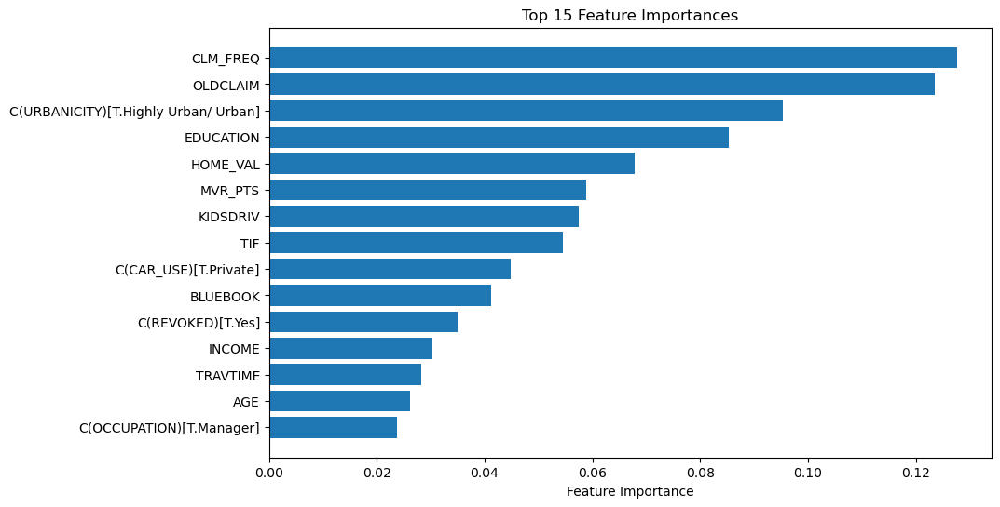

In [56]:
import matplotlib.pyplot as plt
# Extract feature importances
feature_importances = model.feature_importances_

features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance in descending order
features_df = features_df.sort_values(by='Importance', ascending=False)

# Display the top 15 most important features
top_15_features = features_df.head(15)
print(top_15_features)

# Plot the top 15 most important features
plt.figure(figsize=(10, 6))
plt.title("Top 15 Feature Importances")
plt.barh(top_15_features['Feature'], top_15_features['Importance'], align="center")
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.xlabel("Feature Importance")
plt.show()

In [ ]:
# Fit the model using GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and best score
print("Best Parameters: ", grid_search.best_params_)
print("Best Cross-Validation Score: ", grid_search.best_score_)

Fitting 3 folds for each of 26244 candidates, totalling 78732 fits


In [ ]:
# Make predictions on the test set using the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))